<a href="https://colab.research.google.com/github/leandro095/Analisi-Dati-Storici-Ferrovie-/blob/main/NLP_Italia_Giappone_ferrovie_principali.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Librerie

In [ ]:
import warnings
import logging
import os
import sys

# 1. SOPPRESSIONE WARNINGS
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", message=".*datetime.utcnow().*")

# Intercettiamo e blocchiamo i warning del kernel Jupyter prima che vengano visualizzati
class FilteredStderr:
    def __init__(self, target):
        self.target = target
    def write(self, s):
        if "DeprecationWarning" not in s and "utcnow" not in s:
            self.target.write(s)
    def flush(self):
        self.target.flush()

sys.stderr = FilteredStderr(sys.stderr)

# 2. Installazione Pyldavis
!pip install -q gensim pyLDAvis pdfplumber > /dev/null

# 3. IMPORTAZIONI
import pandas as pd
import numpy as np
import gensim
import gensim.corpora as corpora
from gensim.models import LdaModel, CoherenceModel
import pyLDAvis
import pyLDAvis.gensim_models
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import re

print("Setup completato. Tutti i warning di sistema sono stati silenziati.")

Setup completato. Tutti i warning di sistema sono stati silenziati.


# Italia

## Estrazione pdf italiano

In [ ]:
# Installazione libreria per estrazione testo da PDF
!pip install -q pdfplumber

import os
import pandas as pd
import pdfplumber

In [ ]:
# applicazione estrazione
path_corpus = '/content/drive/MyDrive/Seminario Giappone/Documenti_Italia/'

def carica_corpus_pdf(path):
    documenti = []
    print(f"Inizio scansione cartella: {path}")
    for filename in os.listdir(path):
        if filename.endswith(".pdf"):
            file_path = os.path.join(path, filename)
            testo_completo = []
            try:
                with pdfplumber.open(file_path) as pdf:
                    for page in pdf.pages:
                        testo_completo.append(page.extract_text() or "")

                testo_finale = "\n".join(testo_completo)
                # Estrazione anno dal nome file (es. 1879...)
                anno = filename.split(' ')[0] if filename[0].isdigit() else "N/A"

                documenti.append({
                    "file": filename,
                    "testo": testo_finale,
                    "anno": anno,
                    "lunghezza": len(testo_finale)
                })
                print(f"Caricato: {filename} ({len(testo_finale)} caratteri)")
            except Exception as e:
                print(f"Errore nel file {filename}: {e}")

    return pd.DataFrame(documenti)

# Esecuzione del caricamento
df = carica_corpus_pdf(path_corpus)
print(f"\nTotale documenti caricati: {len(df)}")
if not df.empty:
    display(df.head())

In [ ]:
# Salvataggio dei dati estratti per sessioni future
nome_file_salvataggio = 'corpus_ferrovie_italiane.csv'
percorso_salvataggio = os.path.join(path_corpus, nome_file_salvataggio)

# Salviamo in formato CSV (encoding utf-8 per preservare i caratteri speciali)
df.to_csv(percorso_salvataggio, index=False, encoding='utf-8')

print(f"Dataset salvato correttamente in: {percorso_salvataggio}")

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Seminario Giappone/Documenti_Italia/corpus_ferrovie_italiane.csv")
df.head()

,file,testo,anno,lunghezza
0,1879 luglio 28.pdf,Atti Parlamentari — 2509 — Sen/ito del Regno\n...,1879,197779
1,1861 luglio 3 On. Peruzzi.pdf,TORNATA DEL 3 LUGLIO 1861\nPRESIDENZA DEL COMM...,1861,174997
2,1884 dicembre 9.pdf,Atti Parlamentari _ 10019 — Camera dei Deputat...,1884,146689
3,1884 dicembre 17 Genala.pdf,Atti Parlamentari — 10291 — Camera dei Deputat...,1884,198660
4,1884 dicembre 20 Magliani.pdf,Atti Parlamentari — 10443\nLEGISLATURA XV — la...,1884,207030


## Pulizia dati

In [ ]:
import re
import spacy
!python -m spacy download it_core_news_sm

print('Librerie per puliza dati caricate correttamente insieme a it_core_news_sm')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 33.0 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('it_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.
Librerie per puliza dati caricate correttamente insieme a it_core_news_sm


In [ ]:
# Carichiamo il modello per l'italiano
nlp = spacy.load('it_core_news_sm')

# Aumentiamo il limite massimo di caratteri per gestire i documenti più voluminosi
# e disabilitiamo i componenti pesanti (parser, ner) che non servono per la lemmatizzazione
nlp.max_length = 2000000

def advanced_clean_historical_text(text):
    if not isinstance(text, str):
        return ""

    # 1. CORREZIONE OCR SPECIFICA E TENTATIVO DI NORMALIZZAZIONE ARCAICA
    replacements = {
        r'ßicula': 'Sicula', r'Beguito': 'Seguito', r'tarlffe': 'tariffe',
        r'pkmentari': 'complementari', r'u\/fizi': 'uffici', r'ujfizi': 'uffici',
        r'potr[åa]': 'potrà', r'sar[åa]': 'sarà', r'éhe': 'che', r'perch[ée]': 'perché',
        r'provincie': 'province', r'principii': 'principi', r'edifizi[i]?': 'edifici', r'sovvenÂ':'sovvenzione', r'fon':'fondo',
        r'spiaggie': 'spiagge', r'operaj': 'operai', r'uomini d\'arte': 'tecnici', r'passivitÃ':'passività', r'BilanciÂ©':'bilancia',
        r'\bfono\b': 'sono', r'\bfopra\b': 'sopra', r'\beffere\b': 'essere', r'interessi':'interesse', r'straordiÂ­':'straordinaria',
        r'eser cizio': 'esercizio', r'econdarie':'secondarie', r'linees':'linee', r'delVAmministrazione':'dell amministrazione',
        r'[|\\_—°]': ' ', r'€™':' ',
        r'\\s+': ' '
    }

    clean_text = text
    for pattern, replacement in replacements.items():
        clean_text = re.sub(pattern, replacement, clean_text, flags=re.IGNORECASE)

    # 2. GESTIONE ALCUNE PAROLE FUSE
    fused_cases = {
        'emeglioancorala': 'e meglio ancora la',
        'perconseguenza': 'per conseguenza',
        'ferroviedellostato': 'ferrovie dello stato'
    }
    for fused, split in fused_cases.items():
        clean_text = clean_text.replace(fused, split)

    # 3. INTEGRAZIONE NLP (spaCy)
    with nlp.select_pipes(disable=["parser", "ner"]):
        doc = nlp(clean_text.lower())

    # Pulizia finale
    tokens = [
        token.lemma_ for token in doc
        if not token.is_stop
        and not token.is_punct
        and not token.like_num
        and len(token.text) > 2
        and not token.text.startswith('—')
    ]

    return " ".join(tokens)

print("Inizio pulizia avanzata...")
df['testo_pulito'] = df['testo'].apply(advanced_clean_historical_text)
df['tokens'] = df['testo_pulito'].apply(lambda x: x.split())

print("Pulizia completata.")
display(df[['file', 'anno', 'testo_pulito']].head())

Inizio pulizia avanzata...
Pulizia completata.


,file,anno,testo_pulito
0,1879 luglio 28.pdf,1879,atto parlamentare sen ito regno sebsioheo disc...
1,1861 luglio 3 On. Peruzzi.pdf,1861,tornare luglio presidenza commendatore rattazz...
2,1884 dicembre 9.pdf,1884,atto parlamentare camera deputato legislatura ...
3,1884 dicembre 17 Genala.pdf,1884,atto parlamentare camera deputato legislatura ...
4,1884 dicembre 20 Magliani.pdf,1884,atto parlamentare legislatura sessione discuss...


## Wordcloud

In [ ]:
# Import librerie necessarie
from collections import Counter
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

In [ ]:
# 1. UNIONE DEL TESTO LEMMATIZZATO
testo_globale = " ".join(df['testo_pulito'].tolist())

# 2. DEFINIZIONE STOP-WORDS PERSONALIZZATE
additional_stopwords = {
    'articolo', 'legge', 'decreto', 'ministero', 'comma', 'allegato', 'vedere', 'presentare', 'regio', 'ufficiale', 'n', 'r', 'd',
    'parlamentare', 'camera', 'senato', 'regno', 'presente', 'giorno', 'esso', 'giugno', 'vero', 'ecc', 'approvato', 'n', 'suddetto',
    'seduta', 'onorevole', 'n', 'il', 'si', 'fare', 'altro', 'dare', 'venire', 'uno', 'a', 'ciò', 'cioe', 'cioé', 'predetto', 'tal',
    'cioè', 'zione', 'credere', 'art', 'colla', 'dire', 'sarànno', 'considerare', 'pel', 'sessione', 'discussione', 'quale', 'collo', 'qualora',
    'verbale', 'vol', 'tenere', 'deputato', 'legislatura', 'ufficio', 'riguardare', 'avvenire', 'luglio', 'facoltà', 'ri', 'delia', 'alcuno',
    'parlare', 'risposta', 'quesito', 'casano', 'di', 'da', 'tornato', 'lla', 'xvi', 'trale', 'des', 'les', 'imperocché', 'casa', 'ri',
    'gazzetta', 'tecchio', 'est', 'pagina', 'zerbo', 'elle', 'lle', 'rumore', 'las', 'lia', 'llo', 'tto', 'culto', 'bongo', 'doda',
    'visocco', 'nervo', 'une', 'Milano', 'signore', 'parola', 'proposta', 'rendere', 'risultare', 'pro', 'susano', 'talabot', 'co',
    'pure', 'anzi', 'com', 'que'
}

stop_words_it = set(stopwords.words('italian'))
stop_words_it.update(additional_stopwords)

print("setup completato. Tutte le stopwords sono state caricate correttamente")

setup completato. Tutte le stopwords sono state caricate correttamente


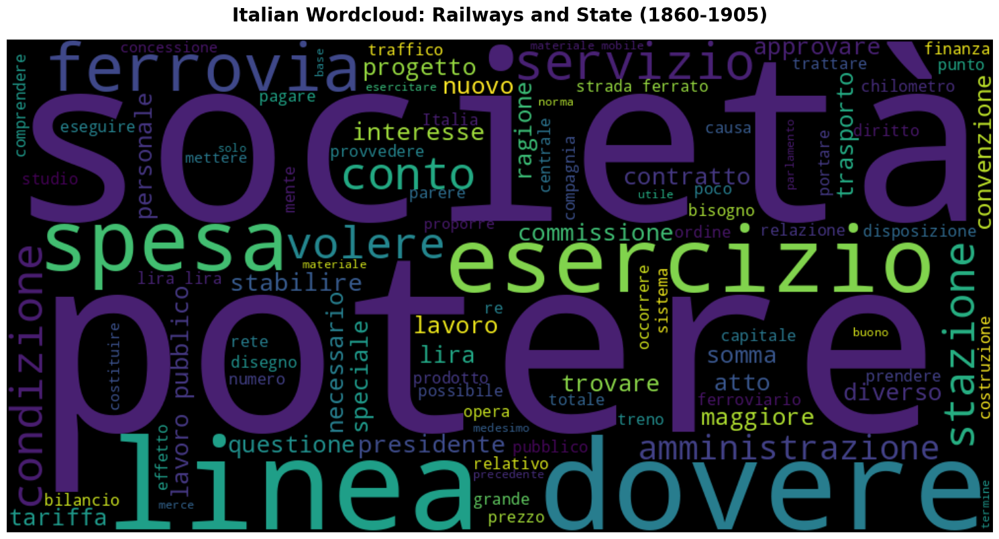

In [ ]:
# 3. CONFIGURAZIONE E GENERAZIONE WORDCLOUD
wc = WordCloud(
    width=1000,
    height=500,
    background_color='black',
    stopwords=stop_words_it,
    max_words=100,
    colormap='viridis',
    random_state=42
).generate(testo_globale)

# 4. VISUALIZZAZIONE
plt.figure(figsize=(15, 8), dpi=100)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Italian Wordcloud: Railways and State (1860-1905)', fontsize=20, pad=20, fontweight='bold')

plt.tight_layout()
plt.show()

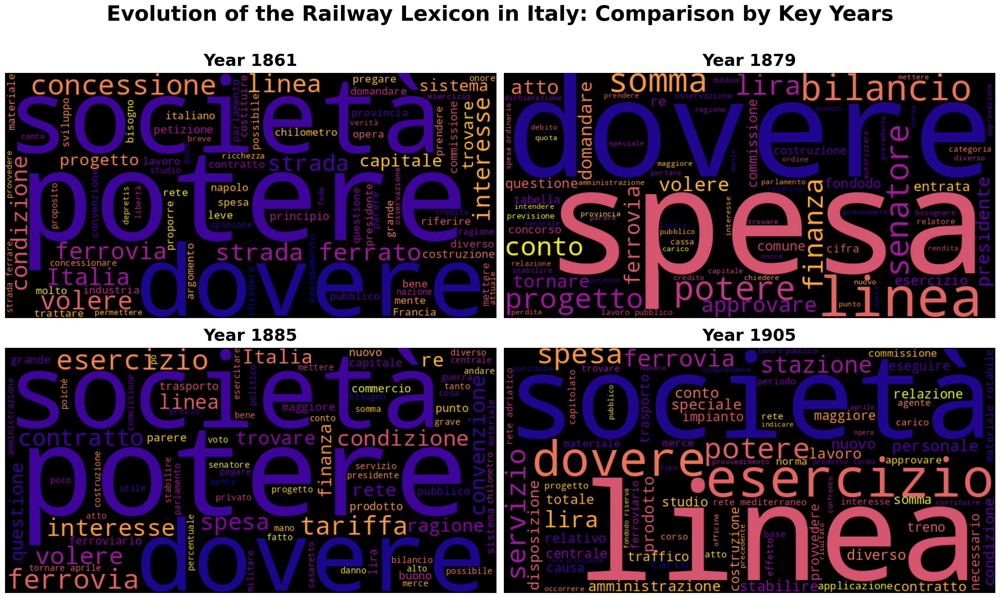

In [ ]:
# 1. ANNI DI INTERESSE
target_years = [1861, 1879, 1885, 1905]

# 2. CONFIGURAZIONE GRIGLIA
fig, axes = plt.subplots(2, 2, figsize=(20, 12), dpi=150)
axes = axes.flatten()

df['anno_num'] = pd.to_numeric(df['anno'].astype(str).str.extract('(\d{4})')[0], errors='coerce')

for i, year in enumerate(target_years):
    # Filtro documenti per l'anno specifico
    text_year = " ".join(df[df['anno_num'] == year]['testo_pulito'].astype(str))

    if len(text_year) > 50:  # Genera solo se c'è abbastanza testo
        wc_year = WordCloud(
            width=800,
            height=400,
            background_color='black',
            stopwords=stop_words_it,
            max_words=80,
            colormap='plasma',
            random_state=42
        ).generate(text_year)

        axes[i].imshow(wc_year, interpolation='bilinear')
        axes[i].set_title(f"Year {year}", fontsize=24, fontweight='bold', pad=10)
    else:
        axes[i].text(0.5, 0.5, f"Dati insufficienti per il {year}",
                     horizontalalignment='center', verticalalignment='center')

    axes[i].axis('off')

plt.suptitle("Evolution of the Railway Lexicon in Italy: Comparison by Key Years", fontsize=30, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

## Frequenze singoli lemmi

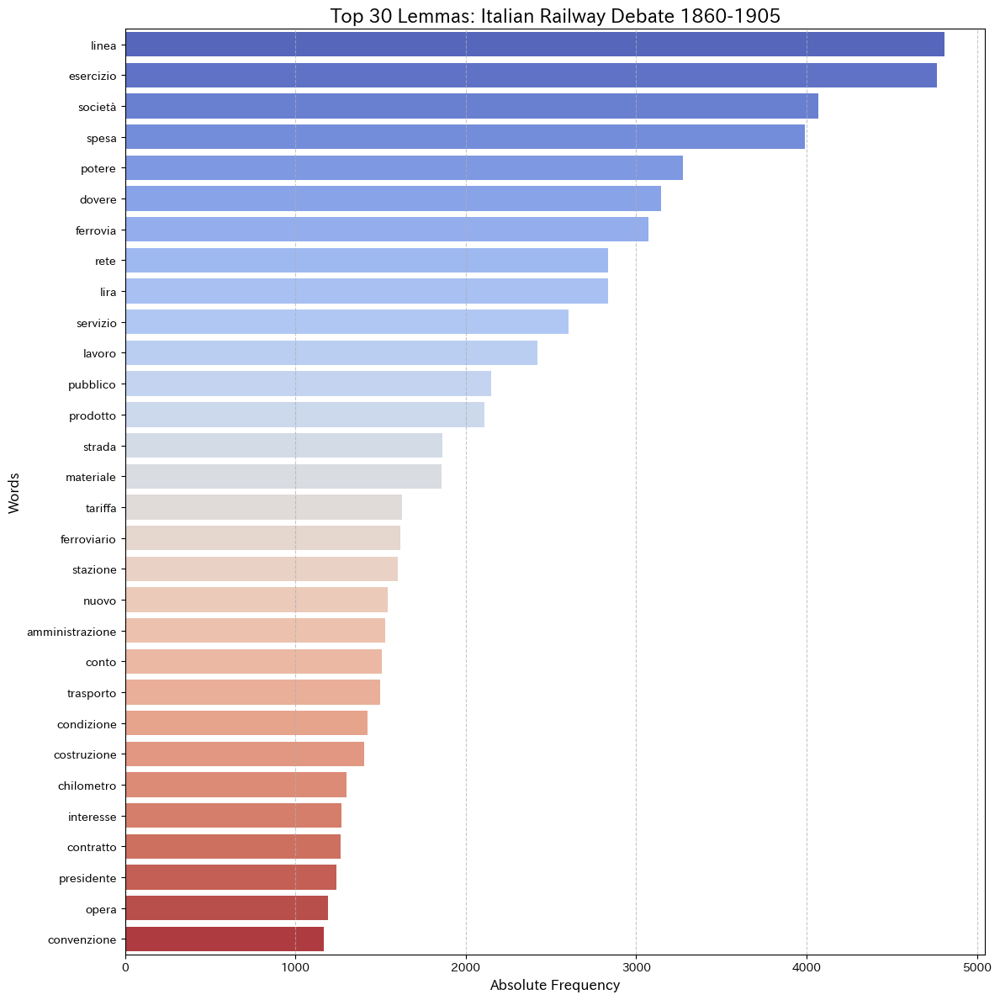

In [ ]:
# 1. CALCOLO FREQUENZE
# Applicazione stopwords
all_tokens = [token for sublist in df['tokens'].dropna() for token in sublist]
filtered_tokens = [t for t in all_tokens if t not in stop_words_it and len(t) > 1]

# Conteggio delle occorrenze
word_freq = Counter(filtered_tokens)

# Creazione DataFrame per i primi 30 risultati
df_freq = pd.DataFrame(word_freq.most_common(30), columns=['Parola', 'Frequenza'])

# 2. VISUALIZZAZIONE GRAFICA
plt.figure(figsize=(12, 12))
sns.barplot(x='Frequenza', y='Parola', data=df_freq, palette='coolwarm', hue='Parola', legend=False)

plt.title('Top 30 Lemmas: Italian Railway Debate 1860-1905', fontsize=16, fontweight='bold')
plt.xlabel('Absolute Frequency', fontsize=12)
plt.ylabel('Words', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

## Bigrammi

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

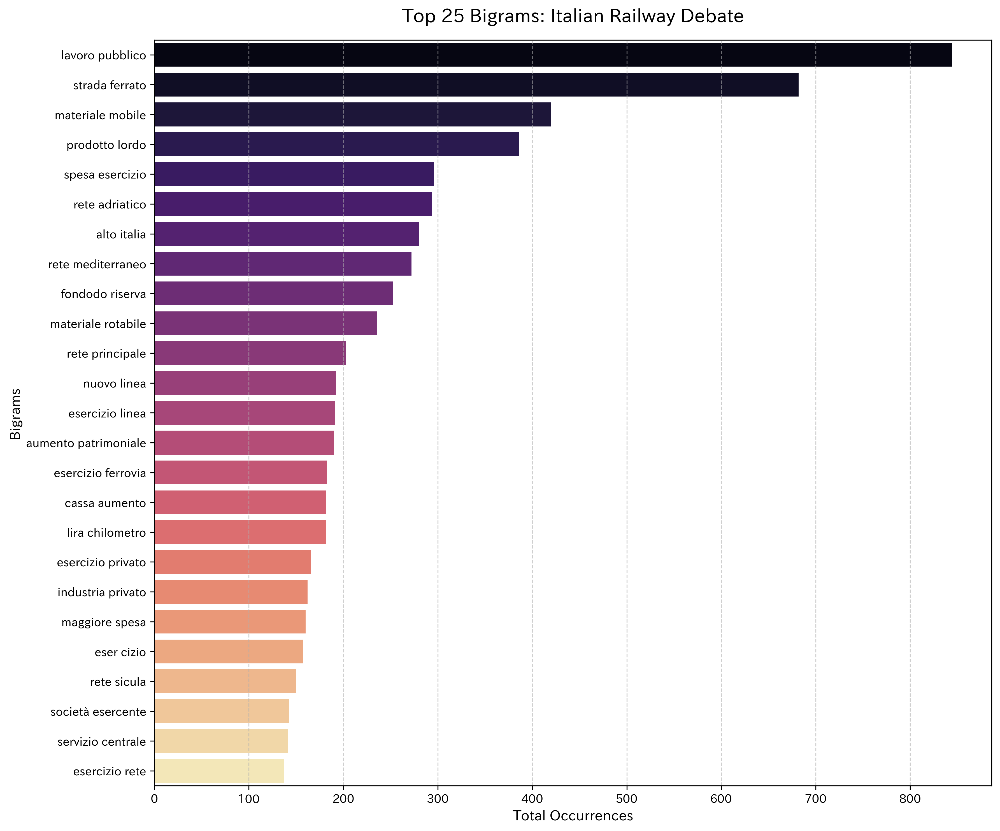

In [ ]:
# 1. CONFIGURAZIONE ESTRAZIONE BIGRAMMI (TOP 25)
vectorizer = CountVectorizer(
    ngram_range=(2, 2),
    stop_words=list(stop_words_it),
    max_features=2000
)

# 2. CALCOLO FREQUENZE ASSOLUTE
bigram_matrix = vectorizer.fit_transform(df['testo_pulito'])
sum_words = bigram_matrix.sum(axis=0)

words_freq_abs = []
for word, idx in vectorizer.vocabulary_.items():
    w1, w2 = word.split()
    # Escludiamo bigrammi composti dalla stessa parola (es. 'ferrovia ferrovia')
    if w1 != w2:
        abs_freq = int(sum_words[0, idx])
        words_freq_abs.append((word, abs_freq))

# Ordinamento e selezione dei primi 25 bigrammi
words_freq_abs = sorted(words_freq_abs, key=lambda x: x[1], reverse=True)
df_bigrams_25 = pd.DataFrame(words_freq_abs[:25], columns=['Bigramma', 'Frequenza Assoluta'])

# 3. VISUALIZZAZIONE
plt.figure(figsize=(12, 10), dpi=300)
sns.barplot(x='Frequenza Assoluta', y='Bigramma', data=df_bigrams_25, palette='magma', hue='Bigramma', legend=False)

plt.title('Top 25 Bigrams: Italian Railway Debate', fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Total Occurrences', fontsize=12)
plt.ylabel('Bigrams', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

### Analisi Diacronica: Evoluzione Temporale dei Bigrammi
In questa sezione analizziamo come la frequenza relativa dei concetti chiave cambia nel tempo, permettendo di identificare i momenti di svolta nelle politiche ferroviarie italiane.

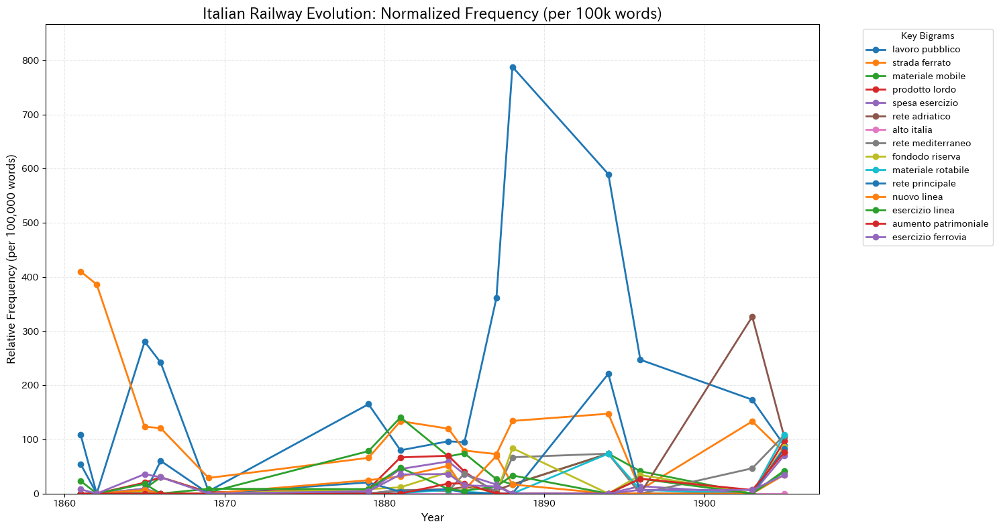

In [ ]:
# 1. SELEZIONE DEI TOP 25 BIGRAMMI
target_bigrams = df_bigrams_25['Bigramma'].tolist()

# 2. CALCOLO DIACRONICO CON NORMALIZZAZIONE (FREQUENZA RELATIVA)
time_data = []
df_temp = df[df['anno_num'].notna()].copy()
df_temp['anno_int'] = df_temp['anno_num'].astype(int)

for anno in sorted(df_temp['anno_int'].unique()):
    # Uniamo i testi dell'anno specifico
    testo_anno = " ".join(df_temp[df_temp['anno_int'] == anno]['testo_pulito'].astype(str).tolist())
    totale_parole = len(testo_anno.split())

    if totale_parole > 0:
        for bigram in target_bigrams:
            # Conteggio occorrenze
            pattern = r'\b' + re.escape(bigram) + r'\b'
            count = len(re.findall(pattern, testo_anno))
            # Normalizzazione su 100.000 parole (Metodologia n. 2 dopo primo tentativo con intero corpus)
            normalized_freq = (count / totale_parole) * 100000
            time_data.append({'anno': anno, 'bigramma': bigram, 'frequenza_relativa': normalized_freq})

df_time_rel = pd.DataFrame(time_data)

# 3. VISUALIZZAZIONE DIACRONICA
plt.figure(figsize=(15, 8))

# Legenda e plot
for bigram in target_bigrams[:15]:
    subset = df_time_rel[df_time_rel['bigramma'] == bigram]
    plt.plot(subset['anno'], subset['frequenza_relativa'], marker='o', label=bigram, linewidth=2)

plt.title('Italian Railway Evolution: Normalized Frequency (per 100k words)', fontsize=16, fontweight='bold')
plt.ylabel('Relative Frequency (per 100,000 words)', fontsize=12)
plt.xlabel('Year', fontsize=12)
plt.legend(title='Key Bigrams', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)

# Adattamento dinamico dell\'asse Y sui dati normalizzati
plt.ylim(0, df_time_rel['frequenza_relativa'].max() * 1.1)

plt.tight_layout()
plt.show()

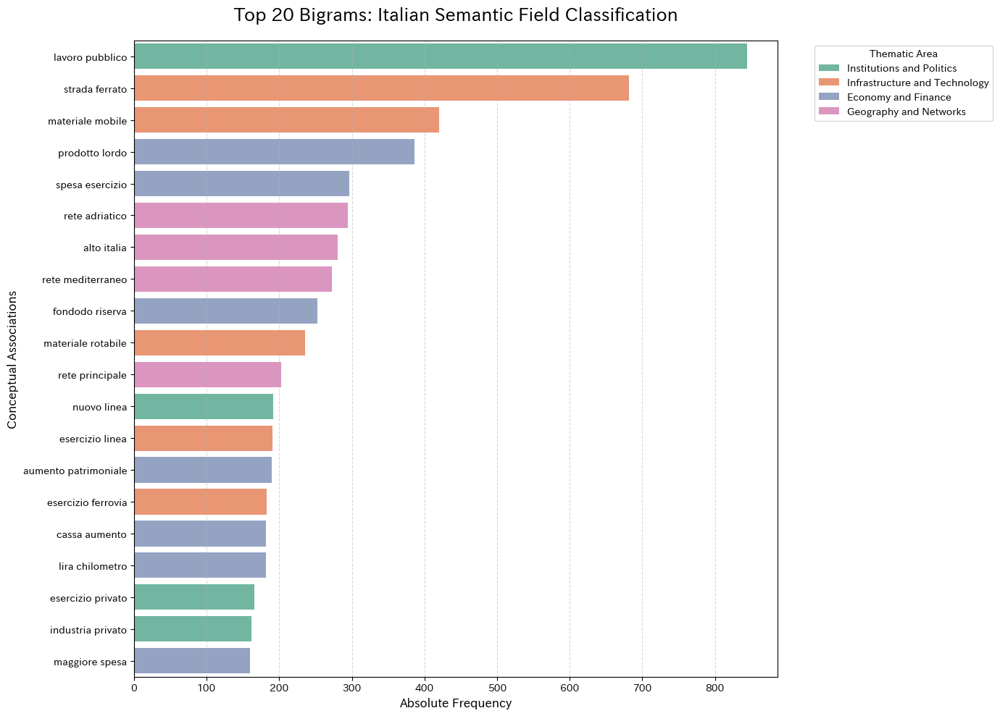

In [ ]:
# 1. ESTRAZIONE DEI TOP 20 BIGRAMMI
vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words=list(stop_words_it), max_features=1000)
bigram_matrix = vectorizer.fit_transform(df['testo_pulito'])
sum_words = bigram_matrix.sum(axis=0)

bigrams_list = []
for word, idx in vectorizer.vocabulary_.items():
    w1, w2 = word.split()
    if w1 != w2:
        bigrams_list.append((word, sum_words[0, idx]))

top_20_bigrams = sorted(bigrams_list, key=lambda x: x[1], reverse=True)[:20]
df_top20 = pd.DataFrame(top_20_bigrams, columns=['Bigramma', 'Frequenza'])

# 2. DEFINIZIONE CAMPI SEMANTICI
def categorizza_bigrammi_preciso(bigramma):
    finanza = ['prodotto lordo', 'fondodo riserva', 'cassa aumento', 'aumento patrimoniale', 'maggiore spesa',
               'lira chilometro', 'spesa esercizio', 'bilancio stato', 'amministrazione ferroviario',
               'fondo speciale']
    tecnica = ['strada ferrata', 'strada ferrato', 'materiale mobile', 'materiale rotabile',
               'esercizio linea', 'esercizio ferrovia', 'esercizio rete', 'officina meccanico', 'trazione vapore', 'linea secondaria',
               'binario unico', 'eser cizio']
    politica = ['lavoro pubblico', 'progetto legge', 'commissione reale', 'relazione ministro', 'industria privato',
                'pubblico utilità', 'consiglio amministrazione', 'risposta quesito', 'sessione discussione', 'società esercente']
    geografia = ['rete adriatico', 'rete mediterraneo', 'rete sicula', 'alto italia', 'ferrovia meridionale', 'rete principale',
                 'società ferrovia']

    if any(word in bigramma for word in finanza): return 'Economy and Finance'
    if any(word in bigramma for word in tecnica): return 'Infrastructure and Technology'
    if any(word in bigramma for word in politica): return 'Institutions and Politics'
    if any(word in bigramma for word in geografia): return 'Geography and Networks'

    # Eliminare la categoria 'Altro'
    if any(word in bigramma for word in ['rete', 'ferrovia', 'italia', 'società']): return 'Geography and Networks'
    return 'Institutions and Politics'

df_top20['Campo Semantico'] = df_top20['Bigramma'].apply(categorizza_bigrammi_preciso)

# 3. VISUALIZZAZIONE
plt.figure(figsize=(14, 10))
sns.barplot(data=df_top20, x='Frequenza', y='Bigramma', hue='Campo Semantico', dodge=False, palette='Set2')

plt.title('Top 20 Bigrams: Italian Semantic Field Classification', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Absolute Frequency', fontsize=12)
plt.ylabel('Conceptual Associations', fontsize=12)
plt.legend(title='Thematic Area', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

## Topic Modeling Thematic Density

Invece di effettuare una semplice analisi di topic modeling, si è effettuata un'analisi di densità tematica, per vedere come i concetti che ho rinvenuto nelle analisi precedenti si evolvessero nel corso del perioso storico analizzato nei documenti, in quanto questi temi rappresentano i punti di svolta politici.

Il codice mappa i 4 dizionari specialistici (Istituzioni, Infrastruttura, Economia, Lavoro) e ne calcola il peso relativo normalizzato per gli anni chiave.

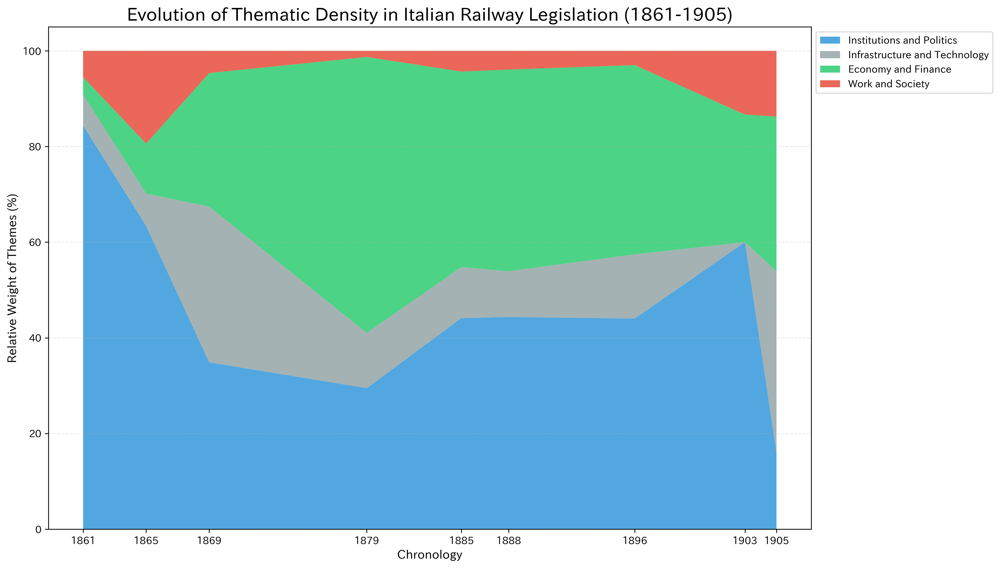

In [ ]:
# 1. DEFINIZIONE DEI VOCABOLARI TARGET
target_vocabularies = {
    'Institutions and Politics': ['lavoro pubblico', 'esercizio privato', 'facoltà riscatto', 'diritto riscatto', 'concessione', 'riscatto'],
    'Infrastructure and Technology': ['strada ferrata', 'materiale mobile', 'opera arte', 'galleria', 'ponte metallico', 'binario', 'rotabile'],
    'Economy and Finance': ['fondo riserva', 'prodotto lordo', 'aumento patrimoniale', 'spesa esercizio', 'lira chilometro', 'bilancio'],
    'Work and Society': ['personale ferroviario', 'sciopero', 'pubblico ufficiale', 'stato giuridico', 'operaio', 'regolamento']
}

# 2. FUNZIONE PER IL CALCOLO DELLA DENSITÀ TEMATICA
def calculate_thematic_density(df, vocabularies, target_years):
    density_results = []
    # Filtro anni
    df_clean = df.copy()
    df_clean['anno_num'] = pd.to_numeric(df_clean['anno'].astype(str).str.extract('(\d{4})')[0], errors='coerce')

    for year in target_years:
        # Selezioniamo i documenti più vicini all'anno target (tolleranza 1 anno per densità)
        subset = df_clean[df_clean['anno_num'].between(year-1, year+1)]
        text_block = " ".join(subset['testo_pulito'].astype(str)).lower()
        total_words = len(text_block.split())

        if total_words > 0:
            year_densities = {'Anno': year}
            raw_scores = {}
            for category, terms in vocabularies.items():
                # Conteggio occorrenze dei termini (inclusi bigrammi)
                score = sum(text_block.count(term) for term in terms)
                raw_scores[category] = score

            # Normalizzazione a 100 per visualizzazione Stacked Area (%)
            total_score = sum(raw_scores.values())
            if total_score > 0:
                for cat in raw_scores:
                    year_densities[cat] = (raw_scores[cat] / total_score) * 100
            else:
                for cat in raw_scores: year_densities[cat] = 0

            density_results.append(year_densities)

    return pd.DataFrame(density_results)

# 3. ESECUZIONE ANALISI
key_years = [1861, 1865, 1869, 1879, 1885, 1888, 1896, 1903, 1905]
df_density = calculate_thematic_density(df, target_vocabularies, key_years)

# 4. VISUALIZZAZIONE STATICA (300 DPI)
plt.figure(figsize=(14, 8), dpi=300)
plt.stackplot(df_density['Anno'],
              [df_density[c] for c in target_vocabularies.keys()],
              labels=target_vocabularies.keys(),
              colors=['#3498db', '#95a5a6', '#2ecc71', '#e74c3c'],
              alpha=0.85)

plt.title("Evolution of Thematic Density in Italian Railway Legislation (1861-1905)", fontsize=18, fontweight='bold')
plt.ylabel("Relative Weight of Themes (%)", fontsize=12)
plt.xlabel("Chronology", fontsize=12)
plt.xticks(key_years)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(axis='y', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

### Visualizzazione Alternativa: Multipli per Categoria
Per migliorare la leggibilità, scomponiamo le macro-aree in grafici distinti ma con lo stesso asse temporale.

Processing Italy...


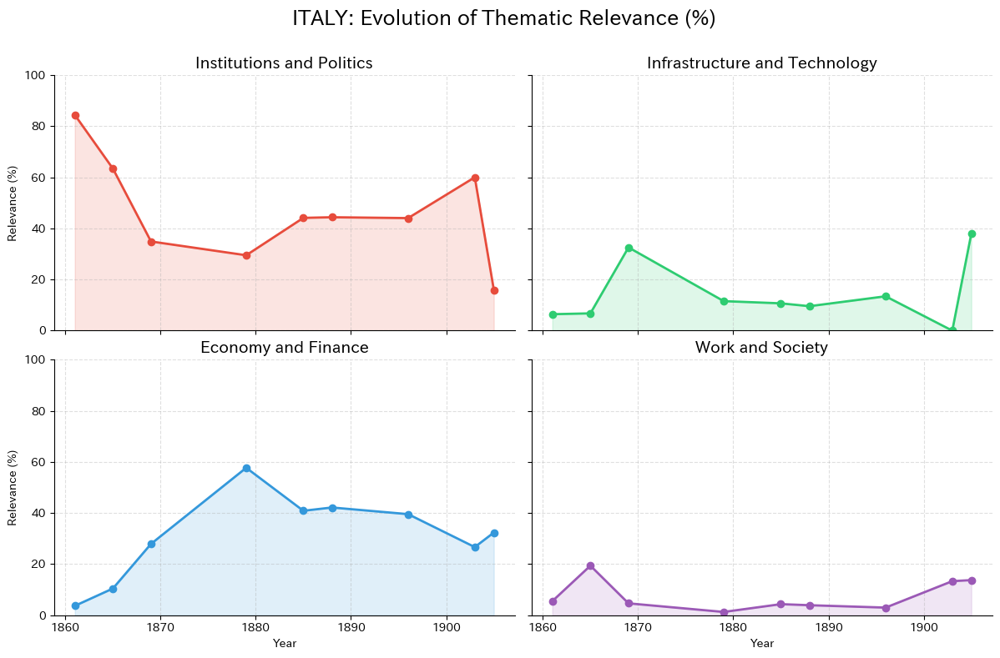

In [ ]:
# 1. Vocabolario Italiano
vocab_it = {
    'Institutions and Politics': ['lavoro pubblico', 'esercizio privato', 'facoltà riscatto', 'diritto riscatto', 'concessione', 'riscatto'],
    'Infrastructure and Technology': ['strada ferrata', 'materiale mobile', 'opera arte', 'galleria', 'ponte metallico', 'binario', 'rotabile'],
    'Economy and Finance': ['fondo riserva', 'prodotto lordo', 'aumento patrimoniale', 'spesa esercizio', 'lira chilometro', 'bilancio'],
    'Work and Society': ['personale ferroviario', 'sciopero', 'pubblico ufficiale', 'stato giuridico', 'operaio', 'regolamento']
}

# Palette Colori
custom_palette = {
    'Institutions and Politics': '#e74c3c',
    'Economy and Finance': '#3498db',
    'Infrastructure and Technology': '#2ecc71',
    'Work and Society': '#9b59b6'
}

def calculate_it_relevance(df, vocab):
    results = []
    df_clean = df.copy()
    df_clean['year_num'] = pd.to_numeric(df_clean['anno'].astype(str).str.extract('(\\d{4})')[0], errors='coerce')

    # Anni chiave per l'Italia
    target_years = [1861, 1865, 1869, 1879, 1885, 1888, 1896, 1903, 1905]

    for year in target_years:
        subset = df_clean[df_clean['year_num'].between(year-1, year+1)]
        text = " ".join(subset['testo_pulito'].dropna().astype(str))

        year_counts = {}
        for category, terms in vocab.items():
            count = sum(text.count(term) for term in terms)
            year_counts[category] = count

        total_hits = sum(year_counts.values())
        if total_hits > 0:
            for category, count in year_counts.items():
                relevance = (count / total_hits) * 100
                results.append({'Year': year, 'Category': category, 'Relevance': relevance})

    return pd.DataFrame(results)

# Esecuzione e Plot
print("Processing Italy...")
df_it_rel_final = calculate_it_relevance(df, vocab_it)

g = sns.FacetGrid(df_it_rel_final, col="Category", col_wrap=2, height=4, aspect=1.5,
                  hue="Category", palette=custom_palette, sharey=True)
g.map(plt.plot, "Year", "Relevance", marker="o", linewidth=2)
g.map(plt.fill_between, "Year", "Relevance", alpha=0.15)

g.set_titles("{col_name}", size=14, fontweight='bold')
g.set_axis_labels("Year", "Relevance (%)")

for ax in g.axes.flatten():
    ax.set_ylim(0, 100)
    ax.grid(True, linestyle='--', alpha=0.4)

plt.subplots_adjust(top=0.88)
g.fig.suptitle('ITALY: Evolution of Thematic Relevance (%)', fontsize=18, fontweight='bold')
plt.show()

# Giappone

In [ ]:
# 1. INSTALLAZIONE LIBRERIE PER NLP GIAPPONESE
!pip install -q sudachipy sudachidict_core fugashi japanize-matplotlib
!pip install -q stopwordsiso

# 2. IMPORTAZIONI SPECIFICHE
import japanize_matplotlib
from sudachipy import dictionary
from sudachipy import tokenizer
import os
import re
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

# Inizializzazione del tokenizer Sudachi
tokenizer_obj = dictionary.Dictionary().create()
mode = tokenizer.Tokenizer.SplitMode.C

print("Ambiente per l'analisi del Giappone pronto.")
print("- SudachiPy configurato per la tokenizzazione e stopwordsiso importate correttamente.")
print("- Supporto font Kanji attivato per Matplotlib.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.1 MB 28.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 51.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 MB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 694.9/694.9 kB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 2.5 MB/s eta 0:00:00
Ambiente per l'analisi del Giappone pronto.
- SudachiPy configurato per la tokenizzazione e stopwordsiso importate correttamente.
- Supporto font Kanji attivato per Matplotlib.


## Librerie

In [ ]:
# Installazione di font che supportano i caratteri Giapponesi
!apt-get install -y fonts-noto-cjk

print("- Font Giapponesi installati correttamente")

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Suggested packages:
  fonts-noto-cjk-extra
The following NEW packages will be installed:
  fonts-noto-cjk
0 upgraded, 1 newly installed, 0 to remove and 1 not upgraded.
Need to get 61.2 MB of archives.
After this operation, 93.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-noto-cjk all 1:20220127+repack1-1 [61.2 MB]
Fetched 61.2 MB in 2s (38.4 MB/s)
Selecting previously unselected package fonts-noto-cjk.
(Reading database ... 118212 files and directories currently installed.)
Preparing to unpack .../fonts-noto-cjk_1%3a20220127+repack1-1_all.deb ...
Unpacking fonts-noto-cjk (1:20220127+repack1-1) ...
Setting up fonts-noto-cjk (1:20220127+repack1-1) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...
- Font Giapponesi installati correttamente


In [ ]:
import stopwordsiso

## Pulizia testi Giapponesi

In [ ]:
def clean_japanese_txt_only(text):
    if not isinstance(text, str) or len(text.strip()) < 2:
        return ""

    # Impostazione chunk size per gestire limiti di memoria di Sudachi
    chunk_size = 10000
    chunks = [text[i:i + chunk_size] for i in range(0, len(text), chunk_size)]

    all_tokens = []

    # Regex per identificare stringhe composte solo da Katakana
    katakana_pattern = re.compile(r'^[\u30A0-\u30FF]+$')

    for chunk in chunks:
        try:
            for m in tokenizer_obj.tokenize(chunk, mode):
                lemma = m.dictionary_form()
                pos = m.part_of_speech()[0]

                # 1. Filtro POS: Sostantivi, Verbi e Aggettivi
                if pos in ['名詞', '動詞', '形容詞']:
                    # 2. Esclusione stopwords caricate e termini troppo brevi
                    if lemma not in jp_stopwords and len(lemma) > 1:
                        # 3. Filtro Katakana (esclude マス, ソレカラ, イウ, ecc.)
                        if not katakana_pattern.match(lemma):
                            # 4. Esclusione numeri e termini di opinione/esistenza specifici
                            if not re.match(r'^[一二三四五六七八九十]+$', lemma):
                                # Esclusione verbi generici/opinione non inclusi nelle stopwords
                                if lemma not in ['思う', '思ふ', '居る', 'ある', 'なる', 'いう']:
                                    all_tokens.append(lemma)
        except Exception as e:
            print(f"Errore durante la tokenizzazione di un blocco: {e}")
            continue

    return " ".join(all_tokens)

print("Funzione di pulizia avanzata (filtro Katakana e Verbi) caricata correttamente.")

Funzione di pulizia avanzata (filtro Katakana e Verbi) caricata correttamente.


In [ ]:
# Carica una lista completa di stopwords giapponesi
jp_stopwords_iso = stopwordsiso.stopwords("ja")

# Stopwords personalizzate
custom_jp_stopwords = {
    'ある', 'する', 'いる', 'こと', 'もの', 'それ', 'これ', 'ため', 'なる', 'れる', 'られる',
    'いう', 'くる', 'いく', 'おり', 'より', 'など', 'とき', 'ところ', 'および', 'これら',
    'による', 'における', 'に対する', 'について', 'によって', 'とともに', 'といった', 'あり', 'です',
    'ます', 'ござい', '等', 'において', 'に対し', 'に関し', 'あるいは', 'もしくは', '基づき', '衆議院',
    '各', '当該', '以下', '以上', '内', 'ありて', '致す', '奉る', '申す', 'または', 'に基づき', '議会',
    '且つ', '尚', '但し', '本', '前記', '一', '二', '三', '四', '諸君', '氏', '閣下', '委員', '帝国',
    '本位', '関する', '建議', 'シテ', 'ルト', 'スル', 'デアル', '云フ', 'デアリマス', 'コト', 'モノ',
    'ソレハ', 'ニシテ', 'ツテ', 'メテ', 'ニモ', 'テハ', 'マス', 'デアリマス', 'イウ', 'ハ', 'ソレカラ',
    'トカ', 'モノハ', '今日', '場合', '必要', 'ござる', '御座る', '宜しい', '宜い', '出來る', '以(I)',
    'る', '思ふ', '思う', '出来る', '程', '若い', '以', '質問', '君', '委員長', '郎', '郞', '郞君',
    '其', '此', '如何', '関係', '以来', '見る', '出る', '答辯', '答弁', '申す', '致す', '思', '思る',
    '説明', '問題', '意見', '賛成', '反対', '議長', '報告', '説明', '質問', '理由', '以つ', '只今', '為メ',
    '見込', '以上', '将来', '矢張', '唯今', '次第', '本員', '将來', '修正', '關係'
}

# Unione
jp_stopwords = jp_stopwords_iso.union(custom_jp_stopwords)

path_corpus_jp = '/content/drive/MyDrive/Seminario Giappone/Documenti_Giappone/'

def convert_meiji_to_gregorian(meiji_year):
    return 1867 + meiji_year

def carica_corpus_giappone(path):
    documenti_jp = []
    if not os.path.exists(path):
        return pd.DataFrame()
    for filename in os.listdir(path):
        if filename.endswith('.txt'):
            file_path = os.path.join(path, filename)
            try:
                with open(file_path, 'r', encoding='utf-8') as f:
                    testo = f.read()
                meiji_match = re.search(r'Meiji[\\s_]?(\\d+)', filename, re.IGNORECASE)
                anno = convert_meiji_to_gregorian(int(meiji_match.group(1))) if meiji_match else "N/A"
                documenti_jp.append({"file": filename, "testo": testo, "anno": anno})
            except Exception as e: continue
    return pd.DataFrame(documenti_jp)

print("Stopwords aggiornate e filtri di pulizia definitivi applicati.")

Stopwords aggiornate e filtri di pulizia definitivi applicati.


In [ ]:
# Applicazione della pulizia
df_jp = carica_corpus_giappone(path_corpus_jp)
if not df_jp.empty:
    df_jp['testo_pulito'] = df_jp['testo'].apply(clean_japanese_txt_only)
    print("Testi puliti con successo.")
else:
    print("Errore: dataframe vuoto.")

Testi puliti con successo.


In [ ]:
# Salvataggio dei dati giapponesi estratti per sessioni future
nome_file_salvataggio_jp = 'corpus_ferrovie_giapponesi.csv'
percorso_salvataggio_jp = os.path.join(path_corpus_jp, nome_file_salvataggio_jp)

# Salviamo in formato CSV (encoding utf-8 per preservare i caratteri Kanji/Kana)
df_jp.to_csv(percorso_salvataggio_jp, index=False, encoding='utf-8')

print(f"Dataset giapponese salvato correttamente in: {percorso_salvataggio_jp}")

# Codice per ricaricarlo in futuro
df_jp = pd.read_csv(percorso_salvataggio_jp)
print(f'Dataset giapponese correttamente caricato')

Dataset giapponese salvato correttamente in: /content/drive/MyDrive/Seminario Giappone/Documenti_Giappone/corpus_ferrovie_giapponesi.csv
Dataset giapponese correttamente caricato


## Wordclouds

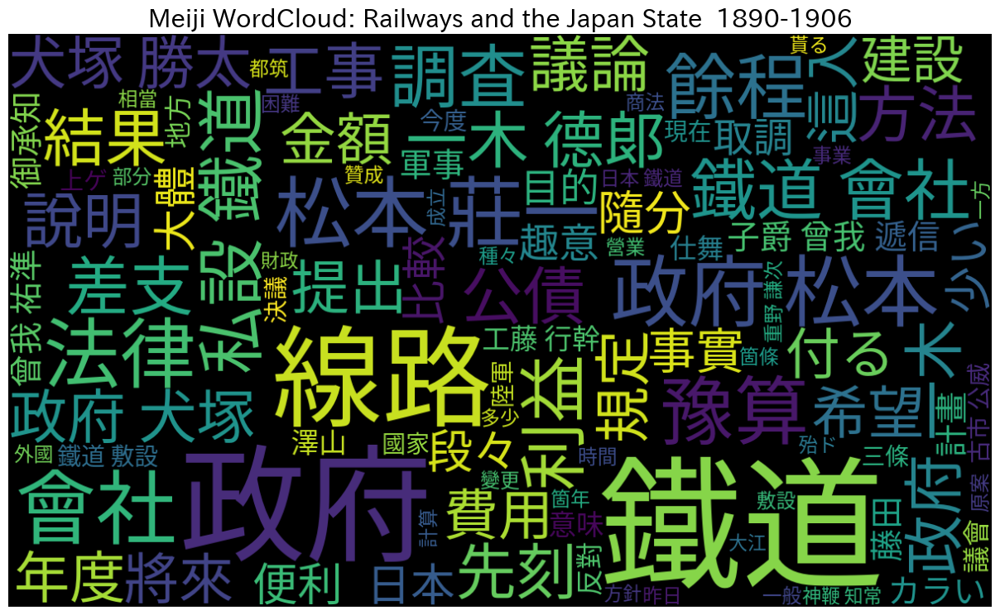

In [ ]:
# Generazione WordCloud Globale
jp_font_path = '/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc'
testo_globale_jp = " ".join(df_jp['testo_pulito'].dropna().astype(str))

wc_jp = WordCloud(
    width=1200,
    height=700,
    background_color='black',
    colormap='viridis',
    max_words=100,
    font_path=jp_font_path
).generate(testo_globale_jp)

plt.figure(figsize=(16, 9))
plt.imshow(wc_jp, interpolation='bilinear')
plt.axis('off')
plt.title('Meiji WordCloud: Railways and the Japan State  1890-1906', fontsize=22, fontweight='bold')
plt.show()

### Wordcloud per periodo

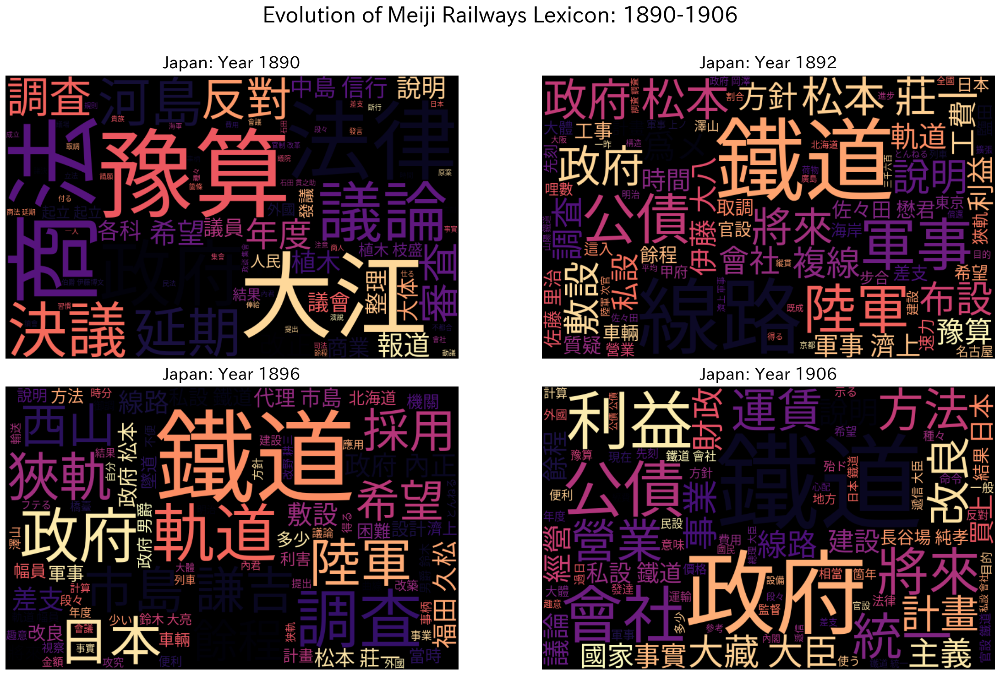

In [ ]:
# 1. Definizione degli anni di interesse
target_years_jp = [1890, 1892, 1896, 1906]

# 2. Estrazione dell'anno
df_jp['anno_num'] = pd.to_numeric(df_jp['file'].astype(str).str.extract('(\d{4})')[0], errors='coerce')

# 3. Griglia 2x2 per WordCloud temporali
fig, axes = plt.subplots(2, 2, figsize=(20, 12), dpi=120)
axes = axes.flatten()

for i, year in enumerate(target_years_jp):
    testo_anno = " ".join(df_jp[df_jp['anno_num'] == year]['testo_pulito'].dropna().astype(str))

    if len(testo_anno.strip()) > 50:
        wc_year = WordCloud(
            width=800,
            height=500,
            background_color='black',
            colormap='magma',
            max_words=80,
            font_path=jp_font_path
        ).generate(testo_anno)

        axes[i].imshow(wc_year, interpolation='bilinear')
        axes[i].set_title(f"Japan: Year {year}", fontsize=22, fontweight='bold', pad=10)
    else:
        axes[i].text(0.5, 0.5, f"Dati non trovati per il {year}",
                     horizontalalignment='center', verticalalignment='center', fontsize=16)

    axes[i].axis('off')

plt.suptitle("Evolution of Meiji Railways Lexicon: 1890-1906", fontsize=28, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

## 2. Analisi dei Bigrammi e Campi Semantici (Giappone)
Adattiamo l'estrazione dei bigrammi per la lingua giapponese.

In [ ]:
import seaborn as sns
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib

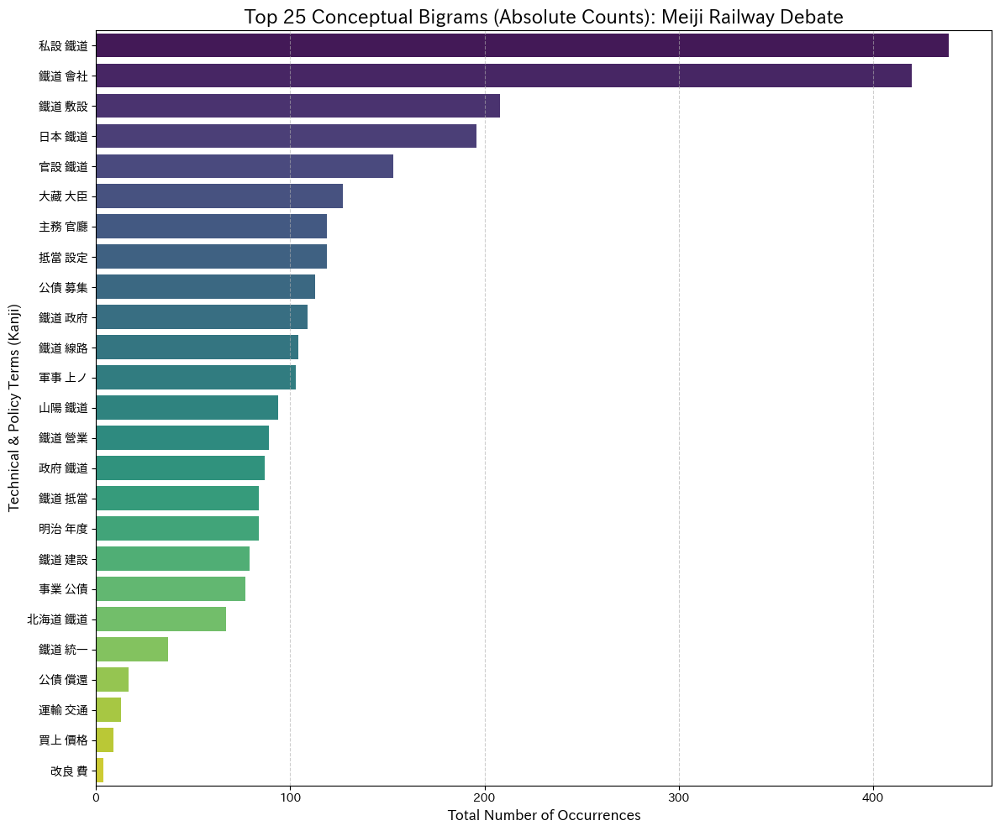

In [ ]:
# 1. Lista definitiva di 25 bigrammi con sostituzione dei termini a zero occorrenze
# Sostituiti '買收 價格' e '純益 金' con '鐵道 抵當' e '公債 募集'
target_bg_jp_25 = [
    '私設 鐵道', '鐵道 會社', '鐵道 敷設', '日本 鐵道', '官設 鐵道', '大藏 大臣', '主務 官廳',
     '抵當 設定', '公債 募集', '鐵道 政府', '鐵道 線路', '軍事 上ノ', '鐵道 營業', '政府 鐵道',
     '鐵道 建設', '事業 公債', '買上 價格', '鐵道 抵當', '鐵道 統一', '改良 費', '公債 償還',
     '運輸 交通', '北海道 鐵道', '山陽 鐵道', '明治 年度'
]

# 2. Definizione Font e Calcolo frequenze
jp_font_path = '/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc'
testo_totale_jp = " ".join(df_jp['testo_pulito'].dropna().astype(str))

final_data_abs = []
for term in target_bg_jp_25:
    # Conteggio occorrenze assolute nel corpus
    count = testo_totale_jp.count(term)
    final_data_abs.append((term, count))

# Creazione DataFrame e ordinamento
df_bg_jp_final = pd.DataFrame(final_data_abs, columns=['Bigramma', 'Frequenza Assoluta']).sort_values(
    by='Frequenza Assoluta', ascending=False)

# 3. Visualizzazione
plt.figure(figsize=(12, 10), dpi=100)
sns.barplot(x='Frequenza Assoluta', y='Bigramma', data=df_bg_jp_final, palette='viridis', hue='Bigramma', legend=False)

plt.title('Top 25 Conceptual Bigrams (Absolute Counts): Meiji Railway Debate', fontsize=16, fontweight='bold')
plt.xlabel('Total Number of Occurrences', fontsize=12)
plt.ylabel('Technical & Policy Terms (Kanji)', fontsize=12)

# Applicazione font giapponese per asse Y
prop = matplotlib.font_manager.FontProperties(fname=jp_font_path)
plt.yticks(fontproperties=prop)

plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

### Evoluzione Diacronica Bigrams Giapponese

In [ ]:
import matplotlib.font_manager

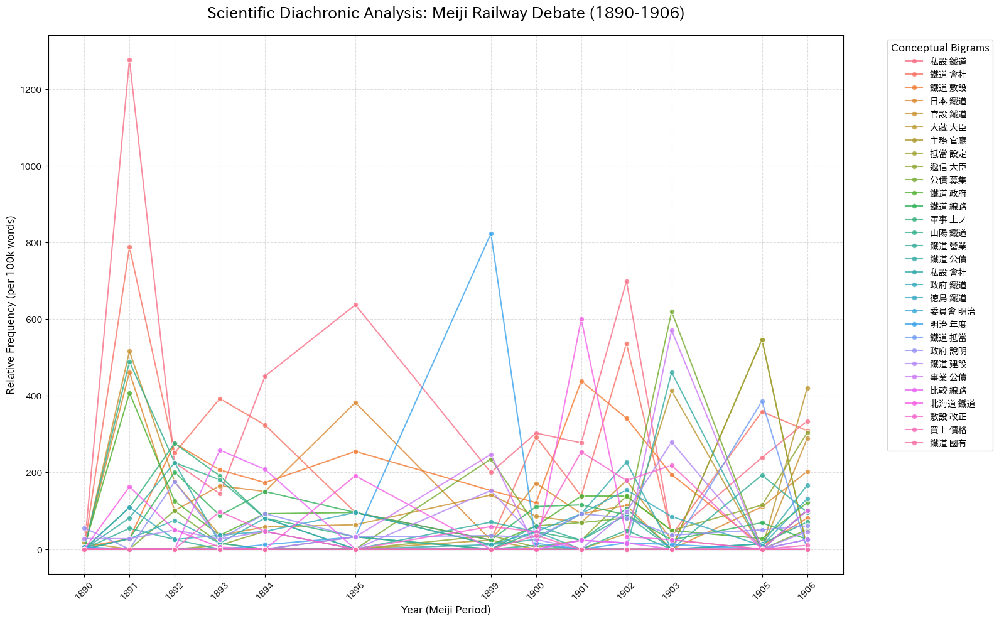

In [ ]:
def analisi_bigrammi_diacronica_jp_scientific(df, target_list):
    time_data = []

    # Filtriamo per l'arco temporale Meiji specifico
    df_filtered = df[(df['anno_num'] >= 1890) & (df['anno_num'] <= 1906)].copy()
    years = sorted(df_filtered['anno_num'].dropna().unique())

    for year in years:
        subset = df_filtered[df_filtered['anno_num'] == year]
        # Uniamo i testi dell'anno per calcolare la frequenza
        testo_anno = " ".join(subset['testo_pulito'].dropna().astype(str))
        tokens_anno = testo_anno.split()
        totale_parole = len(tokens_anno)

        if totale_parole > 0:
            for bigram in target_list:
                # Conteggio occorrenze esatte del bigramma
                count = testo_anno.count(bigram)
                # Frequenza relativa (su 100.000 parole)
                rel_freq = (count / totale_parole) * 100000
                time_data.append({'Year': year, 'Bigram': bigram, 'Freq': rel_freq})

    df_plot = pd.DataFrame(time_data)

    # Configurazione Grafica
    plt.figure(figsize=(16, 10), dpi=100)
    # Usiamo una palette cromatica varia (husl) per distinguere 30 linee
    sns.lineplot(data=df_plot, x='Year', y='Freq', hue='Bigram',
                 palette='husl', marker='o', linewidth=1.5, alpha=0.8)

    plt.title('Scientific Diachronic Analysis: Meiji Railway Debate (1890-1906)', fontsize=18, fontweight='bold', pad=20)
    plt.ylabel('Relative Frequency (per 100k words)', fontsize=12)
    plt.xlabel('Year (Meiji Period)', fontsize=12)

    # Legenda esterna a destra
    prop = matplotlib.font_manager.FontProperties(fname=jp_font_path, size=10)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', prop=prop, title='Conceptual Bigrams', title_fontsize=12, ncol=1)

    plt.grid(True, linestyle='--', alpha=0.4)
    plt.xticks(years, rotation=45)
    plt.tight_layout()
    plt.show()

# Lista di 30 termini concettuali/tecnici specifici
target_bg_jp_scientific = [
    '私設 鐵道', '鐵道 會社', '鐵道 敷設', '日本 鐵道', '官設 鐵道',
    '大藏 大臣', '主務 官廳', '抵當 設定', '遞信 大臣', '公債 募集',
    '鐵道 政府', '鐵道 線路', '軍事 上ノ', '山陽 鐵道', '鐵道 營業',
    '鐵道 公債', '私設 會社', '政府 鐵道', '徳島 鐵道', '委員會 明治',
    '明治 年度', '鐵道 抵當', '政府 說明', '鐵道 建設', '事業 公債',
    '比較 線路', '北海道 鐵道', '敷設 改正', '買上 價格', '鐵道 國有'
]

# Esecuzione
analisi_bigrammi_diacronica_jp_scientific(df_jp, target_bg_jp_scientific)

## 3. Thematic Density
Infine, eseguiamo l'analisi della densità tematica per mappare l'importanza relativa di Infrastrutture, Economia, Istituzioni e Lavoro nel tempo.

Processing Japan...


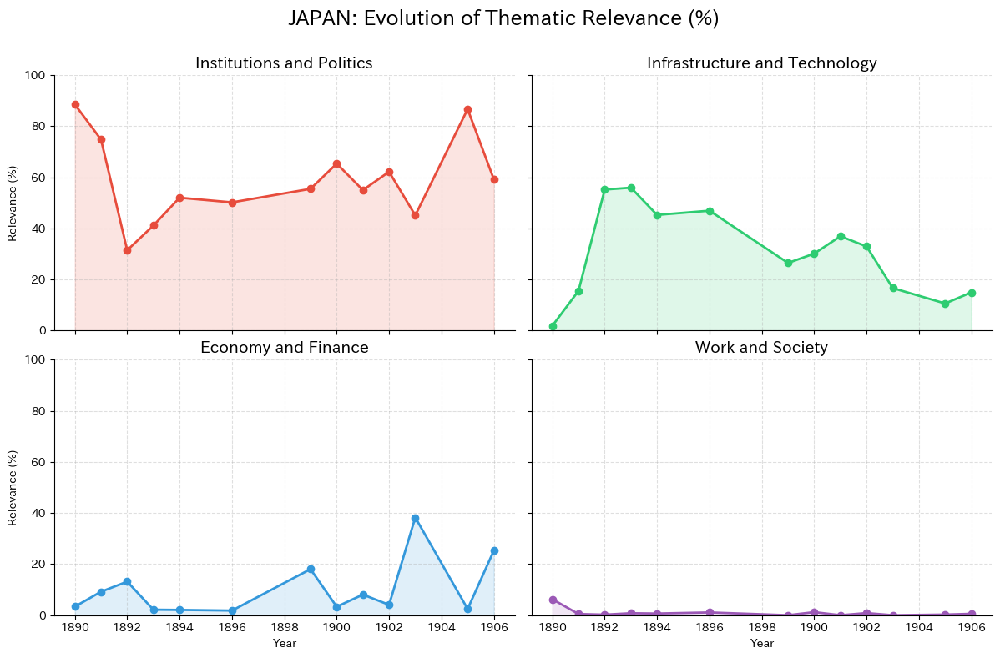

In [ ]:
# 1. Definizione Vocabolario Giapponese
vocab_jp = {
    'Institutions and Politics': ['政府', '布告', '官設', '私設', '条例', '許可', '法律', '命令', '監督'],
    'Infrastructure and Technology': ['鉄道', '線路', '機関車', '建設', '停車場', '橋梁', '敷設', '工事', '軌道'],
    'Economy and Finance': ['資本', '利子', '収入', '経費', '公債', '銀行', '大蔵', '予算', '価格'],
    'Work and Society': ['工員', '賃金', '雇用', '技術者', '労働', '人員', '給料', '罷工']
}

# Palette Colori Comune
custom_palette = {
    'Institutions and Politics': '#e74c3c',
    'Economy and Finance': '#3498db',
    'Infrastructure and Technology': '#2ecc71',
    'Work and Society': '#9b59b6'
}

def calculate_thematic_relevance(df, vocab, country_name):
    results = []
    df_clean = df.copy()
    # Estrazione anni
    df_clean['year_plot'] = pd.to_numeric(df_clean['file'].astype(str).str.extract('(\\d{4})')[0], errors='coerce')
    if df_clean['year_plot'].isna().all():
        df_clean['year_plot'] = pd.to_numeric(df_clean['anno'], errors='coerce')

    years = sorted(df_clean['year_plot'].dropna().unique())

    for year in years:
        subset = df_clean[df_clean['year_plot'] == year]
        text = " ".join(subset['testo_pulito'].dropna().astype(str))
        total_words = len(text.split())

        if total_words > 50:
            year_counts = {}
            for category, terms in vocab.items():
                count = sum(text.count(term) for term in terms)
                year_counts[category] = count

            total_category_hits = sum(year_counts.values())

            if total_category_hits > 0:
                for category, count in year_counts.items():
                    relevance = (count / total_category_hits) * 100
                    results.append({'Year': int(year), 'Category': category, 'Relevance': relevance})

    return pd.DataFrame(results)

def plot_relevance(df_plot, title):
    g = sns.FacetGrid(df_plot, col="Category", col_wrap=2, height=4, aspect=1.5,
                      hue="Category", palette=custom_palette, sharey=True)
    g.map(plt.plot, "Year", "Relevance", marker="o", linewidth=2)
    g.map(plt.fill_between, "Year", "Relevance", alpha=0.15)

    g.set_titles("{col_name}", size=14, fontweight='bold')
    g.set_axis_labels("Year", "Relevance (%)")

    for ax in g.axes.flatten():
        ax.set_ylim(0, 100)
        ax.grid(True, linestyle='--', alpha=0.4)

    plt.subplots_adjust(top=0.88)
    g.fig.suptitle(title, fontsize=18, fontweight='bold')
    plt.show()

# Esecuzione per il Giappone
print("Processing Japan...")
df_jp_rel = calculate_thematic_relevance(df_jp, vocab_jp, "JAPAN")
plot_relevance(df_jp_rel, 'JAPAN: Evolution of Thematic Relevance (%)')

# Grafici Comparativi Italia-Giappone

## Wordcloud Generale Comparativa

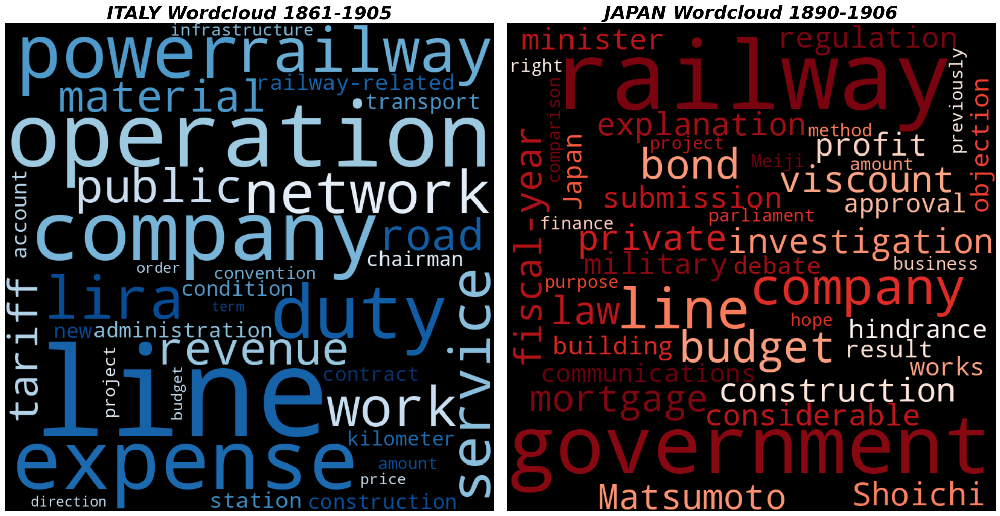

In [ ]:
# 1. CONFIGURAZIONE FONT GARAMOND
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Garamond']

# 1. DIZIONARIO DI TRADUZIONE PER L'ITALIA
trad_it_full = {
    'linea': 'line', 'esercizio': 'operation', 'società': 'company', 'spesa': 'expense',
    'potere': 'power', 'ferrovia': 'railway', 'rete': 'network', 'progetto': 'project',
    'stato': 'state', 'servizio': 'service', 'lavoro': 'work', 'interest': 'interest',
    'costruzione': 'construction', 'convenzione': 'convention', 'strada': 'road', 'dovere': 'duty',
    'lira': 'lira', 'pubblico': 'public', 'prodotto': 'revenue', 'materiale': 'material',
    'tariffa': 'tariff', 'ferroviario': 'railway-related', 'stazione': 'station',
    'nuovo': 'new', 'amministrazione': 'administration', 'conto': 'account',
    'trasporto': 'transport', 'condizione': 'condition', 'chilometro': 'kilometer',
    'contratto': 'contract', 'presidente': 'chairman', 'opera': 'infrastructure', 'legge': 'law',
    'provincia': 'province', 'consiglio': 'council', 'governo': 'government', 'anno': 'year',
    'spese': 'expenses', 'parte': 'part', 'direzione': 'direction', 'prezzo': 'price',
    'misura': 'measure', 'somma': 'amount', 'termine': 'term', 'ordine': 'order',
    'tratto': 'section', 'societa': 'company', 'ferrovie': 'railways', 'bilancio': 'budget'
}

# 2. DIZIONARIO DI TRADUZIONE PER IL GIAPPONE
trad_jp_full = {
    '鐵道': 'railway', '政府': 'government', '線路': 'line', '會社': 'company',
    '豫算': 'budget', '公債': 'bond', '法律': 'law', '抵當': 'mortgage', '年度': 'fiscal-year',
    '子爵': 'viscount', '私設': 'private', '松本': 'Matsumoto', '調査': 'investigation',
    '敷設': 'construction', '說明': 'explanation', '莊一': 'Shoichi', '利益': 'profit',
    '提出': 'submission', '大臣': 'minister', '軍事': 'military', '餘程': 'considerable',
    '規定': 'regulation', '遞信': 'communications', '差支': 'hindrance', '日本': 'Japan',
    '贊成': 'approval', '工事': 'works', '建設': 'building', '異議': 'objection',
    '結果': 'result', '議論': 'debate', '議會': 'parliament', '比較': 'comparison',
    '明治': 'Meiji', '營業': 'business', '金額': 'amount', '方法': 'method',
    '目的': 'purpose', '先刻': 'previously', '財政': 'finance', '希望': 'hope',
    '權利': 'right', '理由': 'reason', '委員': 'committee', '事業': 'project', '買上': 'purchase',
    '價格': 'price', '改築': 'reconstruction', '運輸': 'transport', '交通': 'traffic'
}

# 3. ELABORAZIONE DATI
def get_translated_freq(tokens, translation_dict, top_n=100):
    counts = Counter(tokens)
    translated = {translation_dict[k]: v for k, v in counts.most_common(top_n) if k in translation_dict}
    return translated

freq_it_eng = get_translated_freq(filtered_tokens, trad_it_full)
freq_jp_eng = get_translated_freq(testo_globale_jp.split(), trad_jp_full)

# 4. GENERAZIONE E VISUALIZZAZIONE
wc_it = WordCloud(width=800, height=800, background_color='black', colormap='Blues').generate_from_frequencies(freq_it_eng)
wc_jp = WordCloud(width=800, height=800, background_color='black', colormap='Reds').generate_from_frequencies(freq_jp_eng)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(wc_it, interpolation='bilinear')
ax1.set_title('ITALY Wordcloud 1861-1905', fontsize=26, fontweight='bold', style='italic', fontfamily='serif')
ax1.axis('off')
ax2.imshow(wc_jp, interpolation='bilinear')
ax2.set_title('JAPAN Wordcloud 1890-1906', fontsize=26, fontweight='bold', style='italic', fontfamily='serif')
ax2.axis('off')

plt.tight_layout()
plt.show()

## Wordcloud Comparativa per periodi

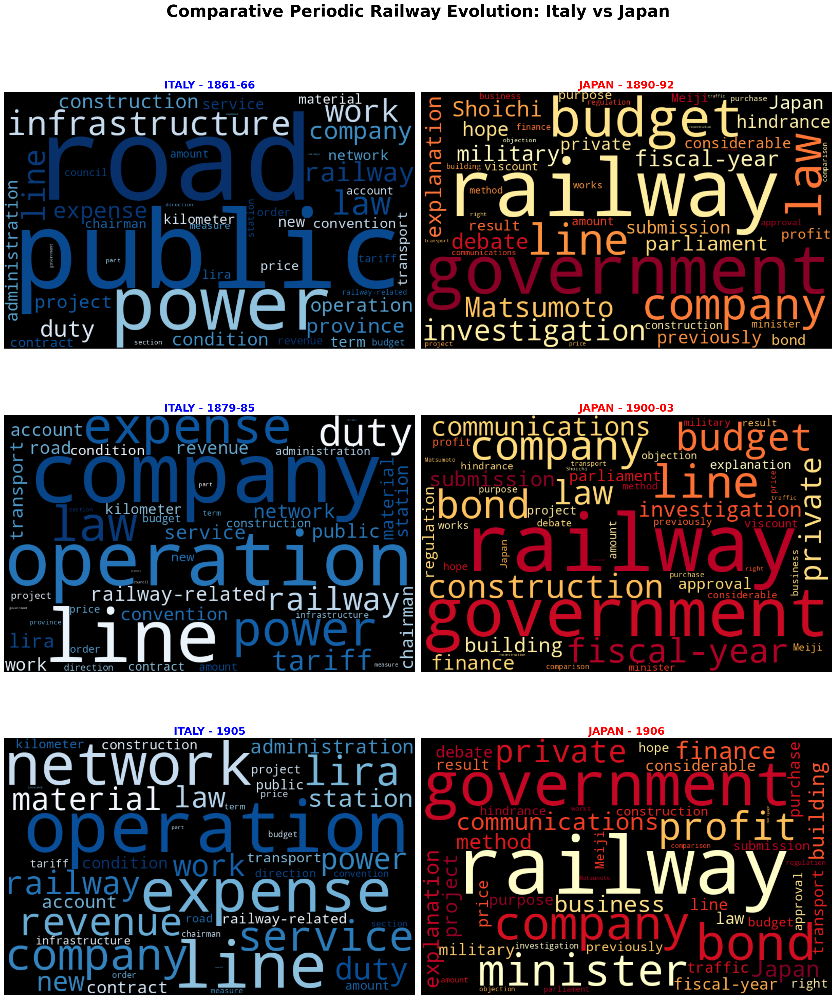

In [ ]:
# 1. Configurazione Font Garamond
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Garamond']

# 1. Pre-processing degli anni per il Giappone
df_jp['anno_clean'] = pd.to_numeric(df_jp['anno'], errors='coerce')
def fix_jp_year(row):
    if pd.notna(row['anno_clean']):
        return row['anno_clean']
    match = re.search(r'(\d{4})', str(row['file']))
    if match:
        return int(match.group(1))
    return None

df_jp['anno_clean'] = df_jp.apply(fix_jp_year, axis=1)

# 2. Definizione delle Fasi Temporali
phases = [
    {'name': '1861-66 vs 1890-92', 'it_years': (1861, 1866), 'jp_years': (1890, 1892)},
    {'name': '1879-85 vs 1900-03', 'it_years': (1879, 1885), 'jp_years': (1900, 1903)},
    {'name': '1905 vs 1906', 'it_years': (1905, 1905), 'jp_years': (1906, 1906)}
]

# 3. Funzione per estrarre e tradurre frequenze
def get_translated_frequencies(df, year_range, translation_dict, year_col):
    mask = (df[year_col] >= year_range[0]) & (df[year_col] <= year_range[1])
    filtered_df = df[mask]
    if filtered_df.empty:
        return {}
    text_block = " ".join(filtered_df['testo_pulito'].dropna().astype(str))
    tokens = text_block.split()
    counts = Counter(tokens)
    translated_counts = {}
    for word, freq in counts.items():
        if word in translation_dict:
            eng_word = translation_dict[word]
            translated_counts[eng_word] = translated_counts.get(eng_word, 0) + freq
    return translated_counts

# 4. Configurazione Grafica
fig, axes = plt.subplots(3, 2, figsize=(20, 25), dpi=150)

for i, phase in enumerate(phases):
    # --- ITALIA ---
    freq_it = get_translated_frequencies(df, phase['it_years'], trad_it_full, 'anno_num')
    if freq_it:
        wc_it = WordCloud(width=800, height=500, background_color='black', colormap='Blues', max_words=60).generate_from_frequencies(freq_it)
        axes[i, 0].imshow(wc_it, interpolation='bilinear')
        axes[i, 0].set_title(f"ITALY - {phase['name'].split(' vs ')[0]}", fontsize=18, fontweight='bold', color='blue', fontfamily='serif')
    else:
        axes[i, 0].text(0.5, 0.5, f"No Data found for {phase['it_years']}", ha='center', va='center', fontsize=14, fontfamily='serif')
    axes[i, 0].axis('off')

    # --- GIAPPONE ---
    freq_jp = get_translated_frequencies(df_jp, phase['jp_years'], trad_jp_full, 'anno_clean')
    if freq_jp:
        wc_jp = WordCloud(width=800, height=500, background_color='black', colormap='YlOrRd', max_words=60).generate_from_frequencies(freq_jp)
        axes[i, 1].imshow(wc_jp, interpolation='bilinear')
        axes[i, 1].set_title(f"JAPAN - {phase['name'].split(' vs ')[1]}", fontsize=18, fontweight='bold', color='red', fontfamily='serif')
    else:
        axes[i, 1].text(0.5, 0.5, f"No Data found for {phase['jp_years']}", ha='center', va='center', fontsize=14, color='red', fontfamily='serif')
    axes[i, 1].axis('off')

# Titolo principale in Garamond (serif)
plt.suptitle("Comparative Periodic Railway Evolution: Italy vs Japan", fontsize=28, fontweight='bold', y=0.998, fontfamily='serif')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

## Comparativo Diacronico per Macro-Categorie

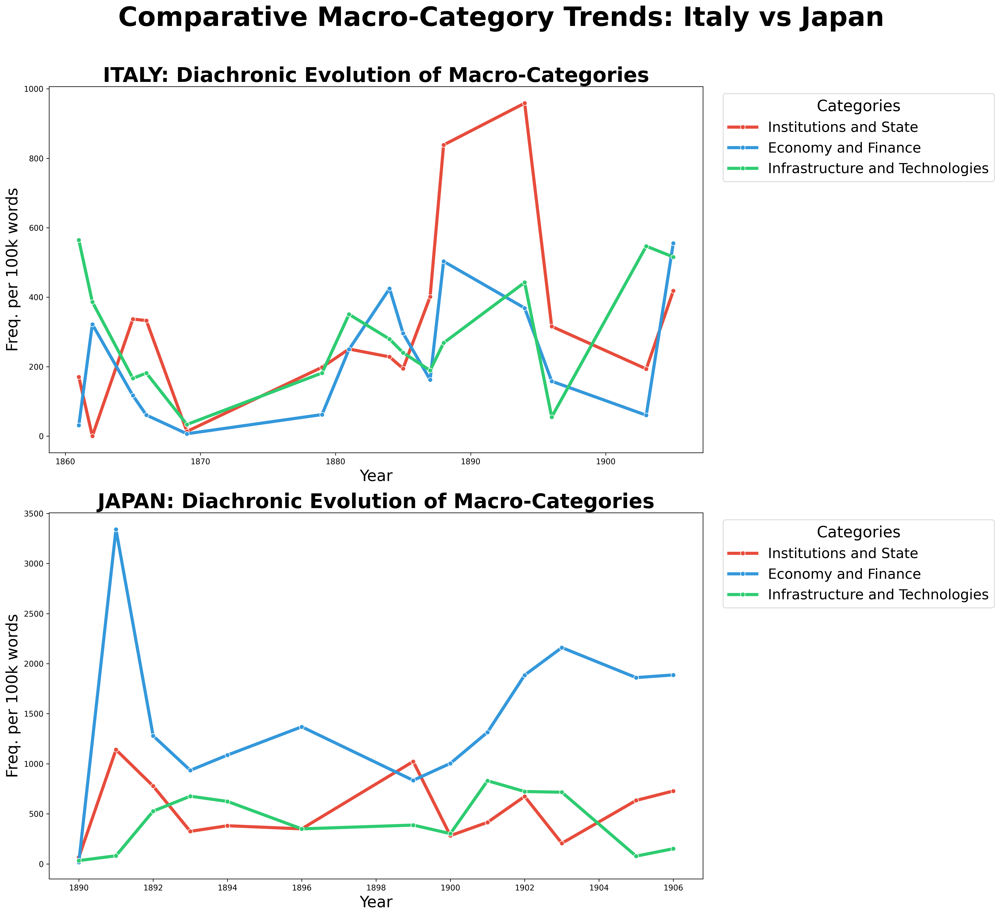

In [ ]:
# 1. Mappatura Macro-Categorie Italia
map_it = {
    'Institutions and State (IT)': ['lavoro pubblico', 'esercizio governativo', 'servizio centrale', 'rete principale', 'esercizio rete', 'eser cizio', 'società esercente', 'esercizio linea', 'esercizio ferrovia'],
    'Economy and Finance (IT)': ['prodotto lordo', 'spesa esercizio', 'fondodo riserva', 'aumento patrimoniale', 'cassa aumento', 'industria privato', 'esercizio privato', 'società ferrovia', 'prodotto iniziale', 'maggiore spesa', 'lira chilometro'],
    'Infrastructure and Technologies (IT)': ['strada ferrato', 'materiale mobile', 'materiale rotabile', 'nuovo linea', 'strada ferrare', 'rete adriatico', 'rete mediterraneo', 'rete sicula', 'alto italia', 'piccola velocità']
}

# 2. Mappatura Macro-Categorie Giappone
map_jp = {
    'Institutions and State (JP)': ['官設 鐵道', '鐵道 政府', '政府 鐵道', '主務 官廳', '委員會 明治', '政府 說明', '鐵道 國有', '軍事 上ノ', '明治 年度'],
    'Economy and Finance (JP)': ['大藏 大臣', '抵當 設定', '公債 募集', '鐵道 公債', '鐵道 抵當', '事業 公債', '買上 價格', '鐵道 營業', '鐵道 會社', '私設 鐵道', '私設 會社', '日本 鐵道', '山陽 鐵道', '徳島 鐵道', '北海道 鐵道'],
    'Infrastructure and Technologies (JP)': ['鐵道 敷設', '鐵道 線路', '鐵道 建設', '比較 線路', '敷設 改正']
}

colors = {'Institutions and State': '#e74c3c', 'Economy and Finance': '#3498db', 'Infrastructure and Technologies': '#2ecc71'}

# Configurazione font Garamond
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Garamond', 'EB Garamond', 'Libre Garamond', 'Times New Roman']

def get_macro_data(df, mapping, label_suffix):
    time_results = []
    year_col = 'anno_num' if label_suffix == 'IT' else ('anno_clean' if 'anno_clean' in df.columns else 'anno_num')
    years = sorted(df[year_col].dropna().unique())
    for year in years:
        subset = df[df[year_col] == year]
        text = " ".join(subset['testo_pulito'].dropna().astype(str))
        total_words = len(text.split())
        if total_words > 0:
            for category, terms in mapping.items():
                clean_cat_name = category.split(' (')[0]
                count = sum(len(re.findall(r'\b' + re.escape(t) + r'\b' if label_suffix == 'IT' else re.escape(t), text)) for t in terms)
                norm_freq = (count / total_words) * 100000
                time_results.append({'Year': int(year), 'Category': clean_cat_name, 'Freq': norm_freq})
    return pd.DataFrame(time_results)

df_macro_it = get_macro_data(df, map_it, 'IT')
df_macro_jp = get_macro_data(df_jp, map_jp, 'JP')

# 3. Visualizzazione
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 16), dpi=300)

sns.lineplot(data=df_macro_it, x='Year', y='Freq', hue='Category', palette=colors, marker='o', ax=ax1, linewidth=4)
ax1.set_title('ITALY: Diachronic Evolution of Macro-Categories', fontsize=26, fontweight='bold', fontfamily='serif')
ax1.set_ylabel('Freq. per 100k words', fontsize=20, fontfamily='serif')
ax1.set_xlabel('Year', fontsize=20, fontfamily='serif')
ax1.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=18, title='Categories', title_fontsize=20)

sns.lineplot(data=df_macro_jp, x='Year', y='Freq', hue='Category', palette=colors, marker='o', ax=ax2, linewidth=4)
ax2.set_title('JAPAN: Diachronic Evolution of Macro-Categories', fontsize=26, fontweight='bold', fontfamily='serif')
ax2.set_ylabel('Freq. per 100k words', fontsize=20, fontfamily='serif')
ax2.set_xlabel('Year', fontsize=20, fontfamily='serif')
ax2.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=18, title='Categories', title_fontsize=20)

plt.suptitle("Comparative Macro-Category Trends: Italy vs Japan", fontsize=34, fontweight='bold', y=1.02, fontfamily='serif')
plt.tight_layout()
plt.show()

## Comparativo Thematic Relevance

In [ ]:
def export_comparative_plots(df_it, df_jp):
    # Configurazione Font Garamond
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['Garamond', 'EB Garamond', 'Libre Garamond']

    # Dimensione figura XL
    fig, axes = plt.subplots(4, 2, figsize=(26, 36), dpi=300)

    # Subplots
    plt.subplots_adjust(hspace=0.40, wspace=0.3, top=0.92, bottom=0.04)

    # Funzione di supporto per mappare i dati sulla griglia
    def fill_grid(df, start_row, country_name):
        categories = ['Institutions and Politics', 'Infrastructure and Technology', 'Economy and Finance', 'Work and Society']
        for i, cat in enumerate(categories):
            row = start_row + (i // 2)
            col = i % 2
            ax = axes[row, col]

            subset = df[df['Category'] == cat]
            sns.lineplot(data=subset, x='Year', y='Relevance', marker='o', ax=ax,
                         color=custom_palette[cat], linewidth=6)
            ax.fill_between(subset['Year'], subset['Relevance'], color=custom_palette[cat], alpha=0.15)


            ax.set_title(f"{country_name}: {cat}", fontsize=26, fontweight='bold', fontfamily='serif', pad=10)
            ax.set_ylim(0, 105)
            ax.set_ylabel("Relevance (%)", fontsize=22, fontfamily='serif')
            ax.set_xlabel("Year", fontsize=22, fontfamily='serif')
            ax.tick_params(axis='both', which='major', labelsize=18)
            ax.grid(True, linestyle='--', alpha=0.4)

    # Popolamento griglia
    fill_grid(df_it_rel_final, 0, "ITALY")
    fill_grid(df_jp_rel, 2, "JAPAN")

    # Titoli di Sezione
    # Italia
    fig.text(0.5, 0.955, 'Comparative Thematic Relevance Analysis: Italy Legislation',
             ha='center', va='center', fontsize=32, fontweight='bold', fontfamily='serif')

    # Giappone
    fig.text(0.5, 0.485, 'Comparative Thematic Relevance Analysis: Japan Legislation',
             ha='center', va='center', fontsize=32, fontweight='bold', fontfamily='serif')

    # Titolo Principale
    fig.suptitle('Cross-National Comparative Thematic Relevance: Railway Legislation History',
                 fontsize=38, fontweight='bold', fontfamily='serif', y=0.985)

    # Salvataggio file
    output_path = 'comparative_thematic_relevance_garamond_xl.png'
    plt.savefig(output_path, bbox_inches='tight', dpi=300)
    plt.show()
    print(f"Grafico aggiornato con spaziatura titoli ottimizzata salvato in: {output_path}")

# Esecuzione
export_comparative_plots(df_it_rel_final, df_jp_rel)

Grafico aggiornato con spaziatura titoli ottimizzata salvato in: comparative_thematic_relevance_garamond_xl.png


## Grafici con traduzione inglese

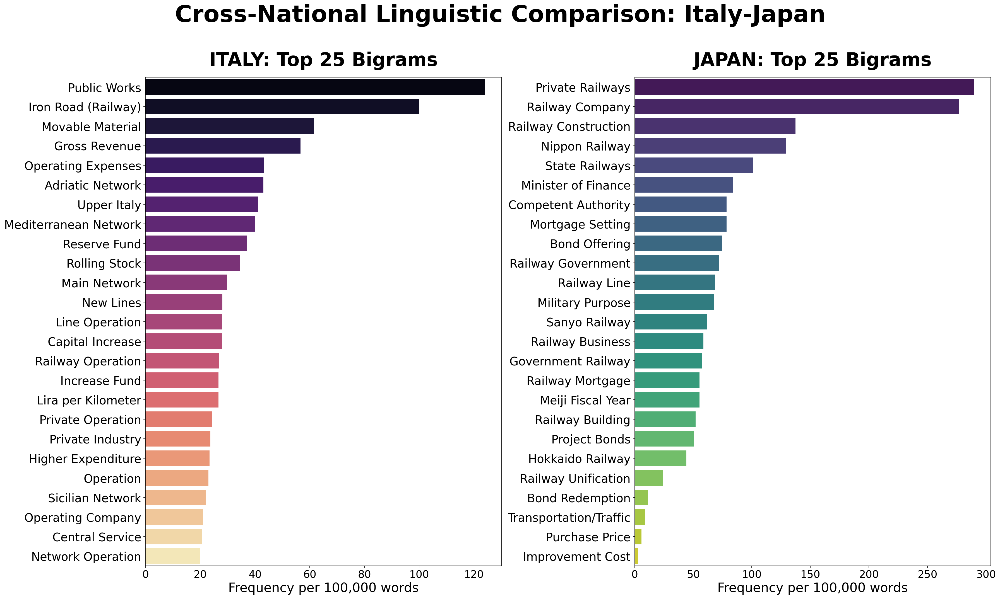

In [ ]:
# 1. Definiamo le traduzioni
trad_it = {
    'lavoro pubblico': 'Public Works', 'strada ferrato': 'Iron Road (Railway)', 'materiale mobile': 'Movable Material',
    'prodotto lordo': 'Gross Revenue', 'spesa esercizio': 'Operating Expenses', 'rete adriatico': 'Adriatic Network',
    'alto italia': 'Upper Italy', 'rete mediterraneo': 'Mediterranean Network', 'fondodo riserva': 'Reserve Fund',
    'materiale rotabile': 'Rolling Stock', 'rete principale': 'Main Network', 'nuovo linea': 'New Lines',
    'esercizio linea': 'Line Operation', 'aumento patrimoniale': 'Capital Increase', 'esercizio ferrovia': 'Railway Operation',
    'cassa aumento': 'Increase Fund', 'lira chilometro': 'Lira per Kilometer', 'esercizio privato': 'Private Operation',
    'industria privato': 'Private Industry', 'maggiore spesa': 'Higher Expenditure', 'eser cizio': 'Operation',
    'rete sicula': 'Sicilian Network', 'società esercente': 'Operating Company', 'servizio centrale': 'Central Service',
    'esercizio rete': 'Network Operation'
}

trad_jp = {
    '私設 鐵道': 'Private Railways', '鐵道 會社': 'Railway Company', '鐵道 敷設': 'Railway Construction',
    '日本 鐵道': 'Nippon Railway', '官設 鐵道': 'State Railways', '大藏 大臣': 'Minister of Finance',
    '主務 官廳': 'Competent Authority', '抵當 設定': 'Mortgage Setting', '公債 募集': 'Bond Offering',
    '鐵道 政府': 'Railway Government', '鐵道 線路': 'Railway Line', '軍事 上ノ': 'Military Purpose',
    '鐵道 營業': 'Railway Business', '政府 鐵道': 'Government Railway', '鐵道 建設': 'Railway Building',
    '事業 公債': 'Project Bonds', '買上 價格': 'Purchase Price', '鐵道 抵當': 'Railway Mortgage',
    '鐵道 統一': 'Railway Unification', '改良 費': 'Improvement Cost', '公債 償還': 'Bond Redemption',
    '運輸 交通': 'Transportation/Traffic', '北海道 鐵道': 'Hokkaido Railway', '山陽 鐵道': 'Sanyo Railway',
    '明治 年度': 'Meiji Fiscal Year'
}

# 2. Calcolo Frequenze Relative (per 100.000 parole)
totale_parole_it = len(" ".join(df['testo_pulito'].dropna().astype(str)).split())
totale_parole_jp = len(" ".join(df_jp['testo_pulito'].dropna().astype(str)).split())

df_it_comp = df_bigrams_25.copy()
df_it_comp['Freq_Relativa'] = (df_it_comp['Frequenza Assoluta'] / totale_parole_it) * 100000
df_it_comp['English_Term'] = df_it_comp['Bigramma'].map(trad_it).fillna(df_it_comp['Bigramma'])

target_bg_jp = list(trad_jp.keys())
final_data_jp = []
testo_totale_jp = " ".join(df_jp['testo_pulito'].dropna().astype(str))

for term in target_bg_jp:
    count = testo_totale_jp.count(term)
    final_data_jp.append({'Bigramma': term, 'Frequenza Assoluta': count})

df_jp_comp = pd.DataFrame(final_data_jp)
df_jp_comp['Freq_Relativa'] = (df_jp_comp['Frequenza Assoluta'] / totale_parole_jp) * 100000
df_jp_comp['English_Term'] = df_jp_comp['Bigramma'].map(trad_jp).fillna(df_jp_comp['Bigramma'])
df_jp_comp = df_jp_comp.sort_values(by='Freq_Relativa', ascending=False)

# 3. Plot Comparativo con Frequenze Relative
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 14), dpi=150)

sns.barplot(data=df_it_comp, x='Freq_Relativa', y='English_Term', palette='magma', ax=ax1, hue='English_Term', legend=False)
ax1.set_title('ITALY: Top 25 Bigrams', fontsize=32, fontweight='bold', pad=20)
ax1.set_xlabel('Frequency per 100,000 words', fontsize=22)
ax1.tick_params(axis='y', labelsize=20)
ax1.tick_params(axis='x', labelsize=18)
ax1.set_ylabel('')

sns.barplot(data=df_jp_comp, x='Freq_Relativa', y='English_Term', palette='viridis', ax=ax2, hue='English_Term', legend=False)
ax2.set_title('JAPAN: Top 25 Bigrams', fontsize=32, fontweight='bold', pad=20)
ax2.set_xlabel('Frequency per 100,000 words', fontsize=22)
ax2.tick_params(axis='y', labelsize=20)
ax2.tick_params(axis='x', labelsize=18)
ax2.set_ylabel('')

plt.suptitle('Cross-National Linguistic Comparison: Italy-Japan', fontsize=40, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

## Lessico storico-economico - Comparative trend analysis

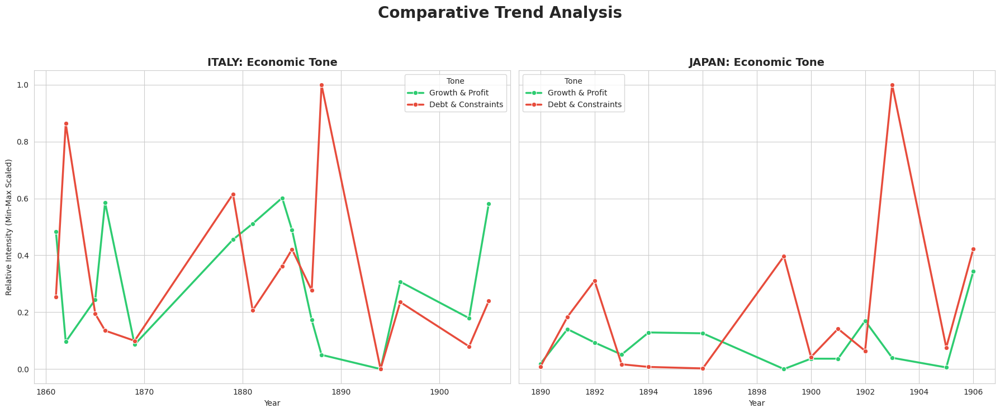

In [ ]:
# 1. Definizione Dizionari 'Sentiment Economico'
eco_sentiment_it = {
    'Growth & Profit': ['prodotto lordo', 'utile', 'rendita', 'sviluppo', 'beneficio', 'incremento', 'attivo', 'progresso'],
    'Debt & Constraints': ['disavanzo', 'debito', 'passività', 'onere', 'imposta', 'deficit', 'spesa straordinaria']
}

eco_sentiment_jp = {
    'Growth & Profit': ['利益', '發達', '發展', '収益', '配当', '貿易'],
    'Debt & Constraints': ['資本', '債務', '公債', '支出', '補助金', '負担']
}

def calculate_eco_polarity_normalized(df, sentiment_dict, country, year_col):
    results = []
    if df.empty: return pd.DataFrame(columns=['Year', 'Tone', 'Intensity', 'Country'])

    df_copy = df.copy()
    if year_col == 'anno_num':
        df_copy['y'] = pd.to_numeric(df_copy[year_col], errors='coerce')
    else:
        df_copy['y'] = pd.to_numeric(df_copy['anno_clean'], errors='coerce')

    years = sorted(df_copy['y'].dropna().unique())

    for year in years:
        text = " ".join(df_copy[df_copy['y'] == year]['testo_pulito'].dropna().astype(str)).lower()
        total_words = len(text.split())
        if total_words > 50:
            for cat, terms in sentiment_dict.items():
                count = sum(text.count(term) for term in terms)
                results.append({
                    'Year': int(year),
                    'Tone': cat,
                    'Intensity': (count / total_words) * 100000,
                    'Country': country
                })

    res_df = pd.DataFrame(results)
    # APPLICAZIONE MIN-MAX SCALING (0-1) per rimuovere la discrepanza di scala
    if not res_df.empty:
        max_val = res_df['Intensity'].max()
        min_val = res_df['Intensity'].min()
        if max_val > min_val:
            res_df['Normalized_Intensity'] = (res_df['Intensity'] - min_val) / (max_val - min_val)
        else:
            res_df['Normalized_Intensity'] = 0

    return res_df

# 2. Elaborazione con Normalizzazione
df_eco_it = calculate_eco_polarity_normalized(df_temp, eco_sentiment_it, 'ITALY', 'anno_num')
df_eco_jp = calculate_eco_polarity_normalized(df_jp, eco_sentiment_jp, 'JAPAN', 'anno_clean')

# 3. Visualizzazione Comparativa (Scala 0-1)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7), sharey=True)
sns.set_style("whitegrid")

# Plot Italia
if not df_eco_it.empty:
    sns.lineplot(data=df_eco_it, x='Year', y='Normalized_Intensity', hue='Tone', marker='o', ax=ax1,
                 palette={'Growth & Profit': '#2ecc71', 'Debt & Constraints': '#e74c3c'}, linewidth=2.5)
    ax1.set_title('ITALY: Economic Tone', fontsize=14, fontweight='bold')
    ax1.set_ylabel('Relative Intensity (Min-Max Scaled)')

# Plot Giappone
if not df_eco_jp.empty:
    sns.lineplot(data=df_eco_jp, x='Year', y='Normalized_Intensity', hue='Tone', marker='o', ax=ax2,
                 palette={'Growth & Profit': '#2ecc71', 'Debt & Constraints': '#e74c3c'}, linewidth=2.5)
    ax2.set_title('JAPAN: Economic Tone', fontsize=14, fontweight='bold')
    ax2.set_ylabel('')

plt.suptitle('Comparative Trend Analysis', fontsize=20, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

## Grafico Coocorrenze comparative Ferrovia-Sviluppo economico

Generating charts with increased title and legend font sizes...


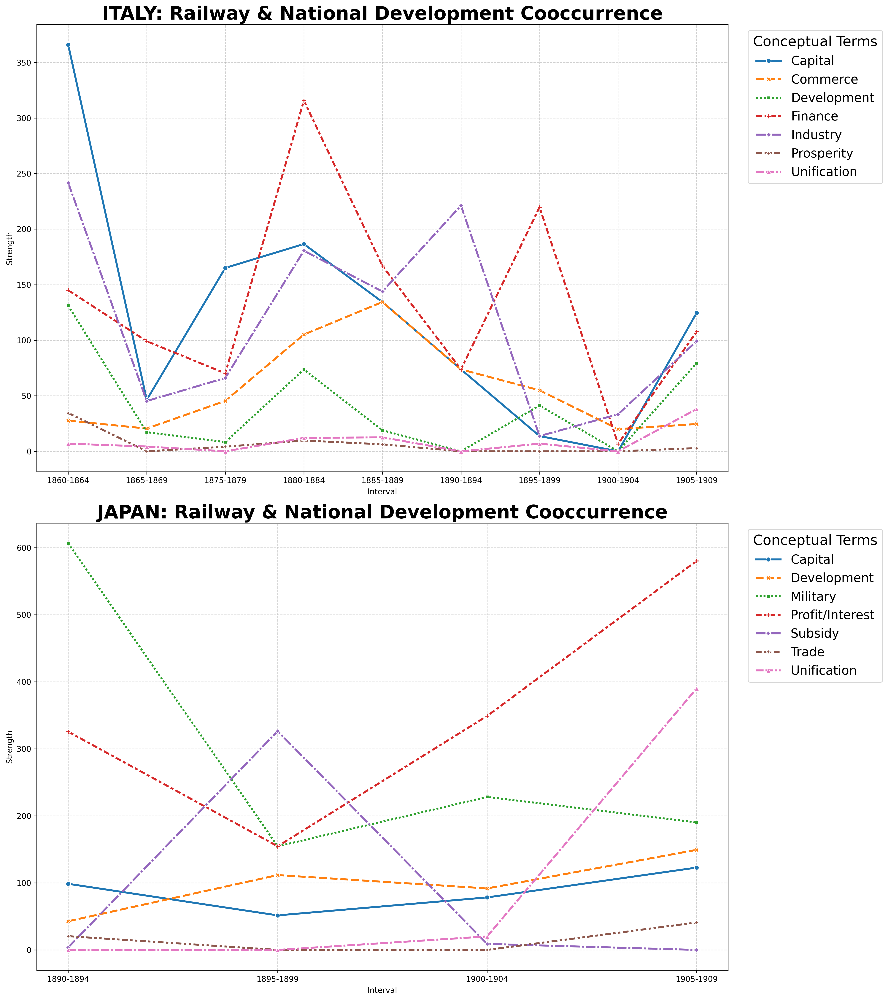

In [ ]:
# 1. Configurazione e traduzioni
context_it = {
    'sviluppo': 'Development',
    'progresso': 'Development',
    'unificazione': 'Unification',
    'prosperità': 'Prosperity',
    'industria': 'Industry',
    'commercio': 'Commerce',
    'capitale': 'Capital',
    'convenzione': 'Finance'
}

context_jp = {
    '統一': 'Unification',
    '發達': 'Development',
    '利益': 'Profit/Interest',
    '資本': 'Capital',
    '貿易': 'Trade',
    '軍事': 'Military',
    '補助金': 'Subsidy'
}

pivot_it = ['ferrovia', 'strada ferrata']
pivot_jp = ['鉄道', '鐵道']

def get_lustro(year):
    if pd.isna(year): return None
    start = int((year // 5) * 5)
    return f"{start}-{start+4}"

def calculate_cooccurrence(df, pivots, context_map, year_col):
    df_c = df.copy()
    def extract_year(val):
        if pd.isna(val): return None
        if isinstance(val, (int, float)): return val
        match = re.search(r'(\d{4})', str(val))
        return int(match.group(1)) if match else None

    df_c['year_numeric'] = df_c[year_col].apply(extract_year)
    df_c = df_c.dropna(subset=['year_numeric'])
    df_c['lustro'] = df_c['year_numeric'].apply(get_lustro)

    results = []
    for l in sorted(df_c['lustro'].dropna().unique()):
        text = " ".join(df_c[df_c['lustro'] == l]['testo_pulito'].dropna().astype(str)).lower()
        total_tokens = len(text.split())
        if total_tokens < 50: continue
        pivot_count = sum(text.count(p) for p in pivots)
        for term, eng in context_map.items():
            term_count = text.count(term)
            score = (min(pivot_count, term_count) / total_tokens) * 100000 if pivot_count > 0 else 0
            results.append({'Interval': l, 'Term': eng, 'Strength': score})

    final_df = pd.DataFrame(results).groupby(['Interval', 'Term'])['Strength'].sum().reset_index()
    return final_df

print("Generating charts with increased title and legend font sizes...")
df_it_cooc = calculate_cooccurrence(df, pivot_it, context_it, 'anno_num')
df_jp_cooc = calculate_cooccurrence(df_jp, pivot_jp, context_jp, 'anno_clean')

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 18), dpi=300)

# Italy Plot
sns.lineplot(data=df_it_cooc, x='Interval', y='Strength', hue='Term', style='Term', markers=True, ax=ax1, linewidth=2.5)
ax1.set_title('ITALY: Railway & National Development Cooccurrence', fontsize=24, fontweight='bold')
ax1.legend(title='Conceptual Terms', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=16, title_fontsize=18)
ax1.grid(True, linestyle='--', alpha=0.6)

# Japan Plot
sns.lineplot(data=df_jp_cooc, x='Interval', y='Strength', hue='Term', style='Term', markers=True, ax=ax2, linewidth=2.5)
ax2.set_title('JAPAN: Railway & National Development Cooccurrence', fontsize=24, fontweight='bold')
ax2.legend(title='Conceptual Terms', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=16, title_fontsize=18)
ax2.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()